In [1]:
install.packages("igraph") 
library(igraph)
library(ggplot2)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)


Attaching package: ‘igraph’


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union




[1] "For probability 0.003"


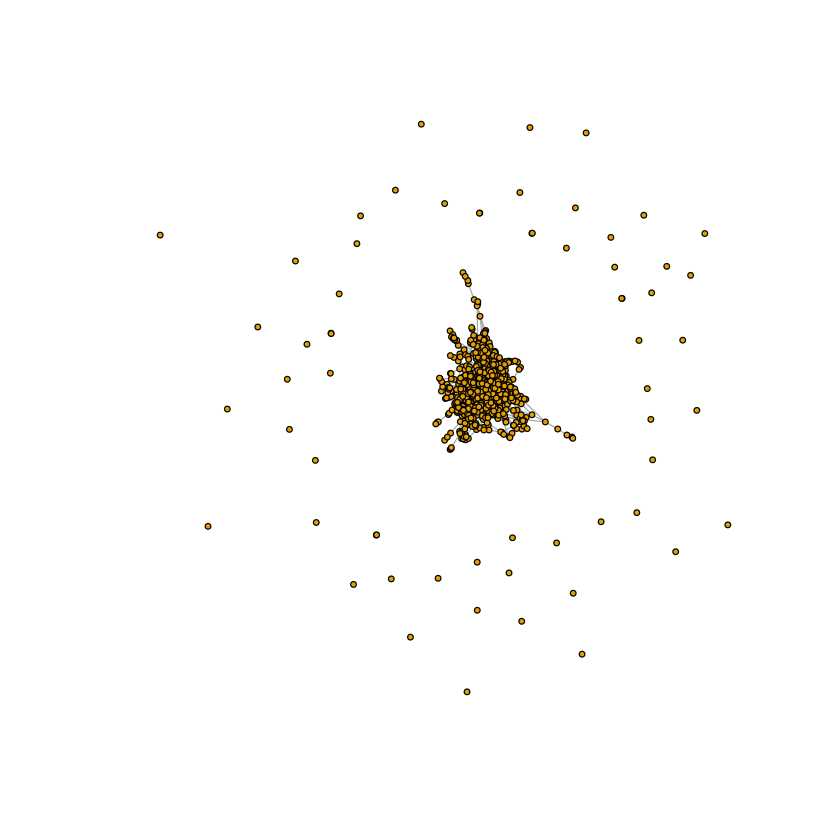

[1] "The mean of degree distribution is 2.994"
[1] "The variance of degree distribution is 2.86282682682683"
[1] "_________________________"
[1] "For probability 0.004"


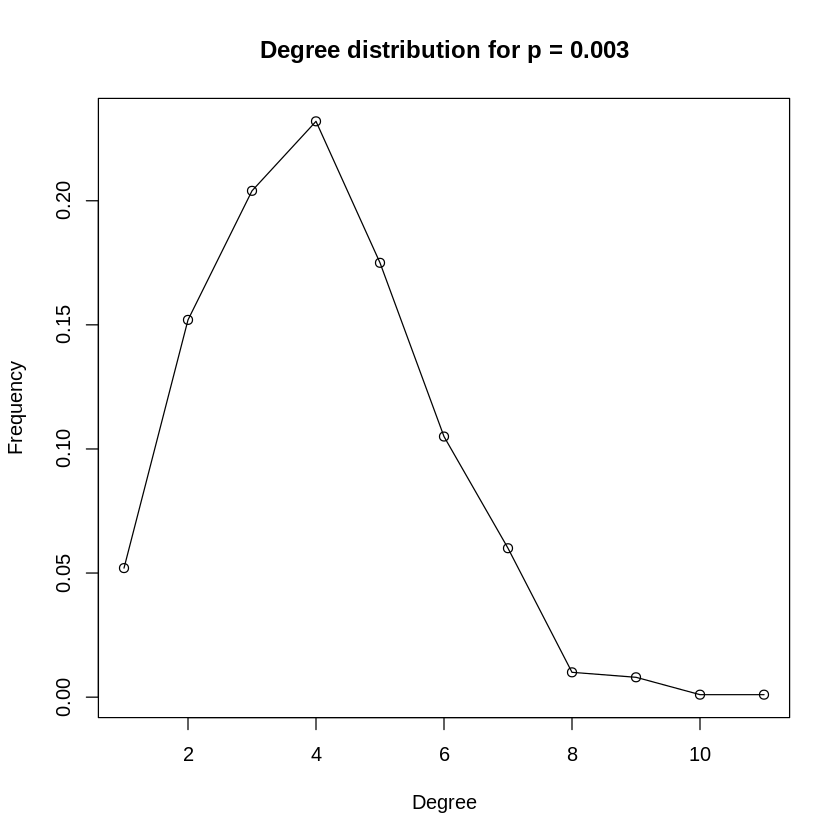

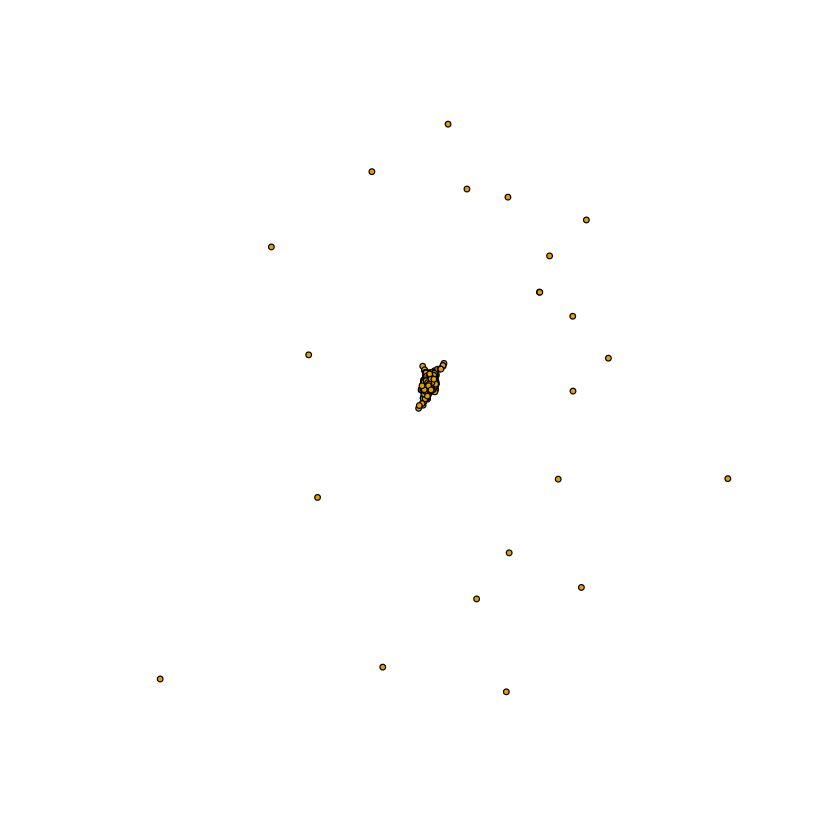

[1] "The mean of degree distribution is 3.916"
[1] "The variance of degree distribution is 3.88883283283283"
[1] "_________________________"
[1] "For probability 0.01"


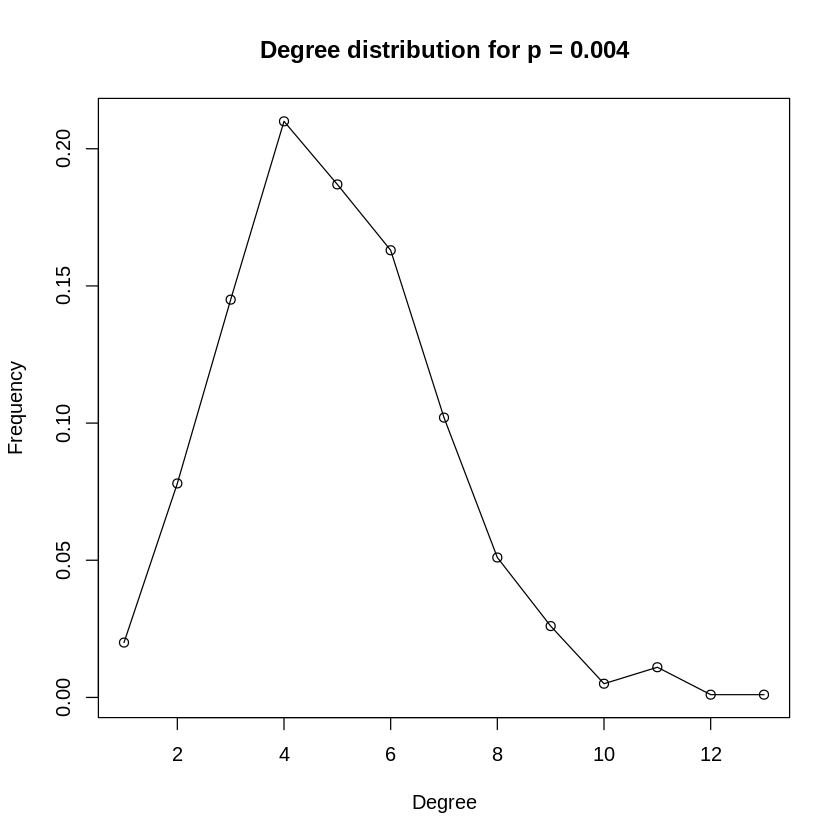

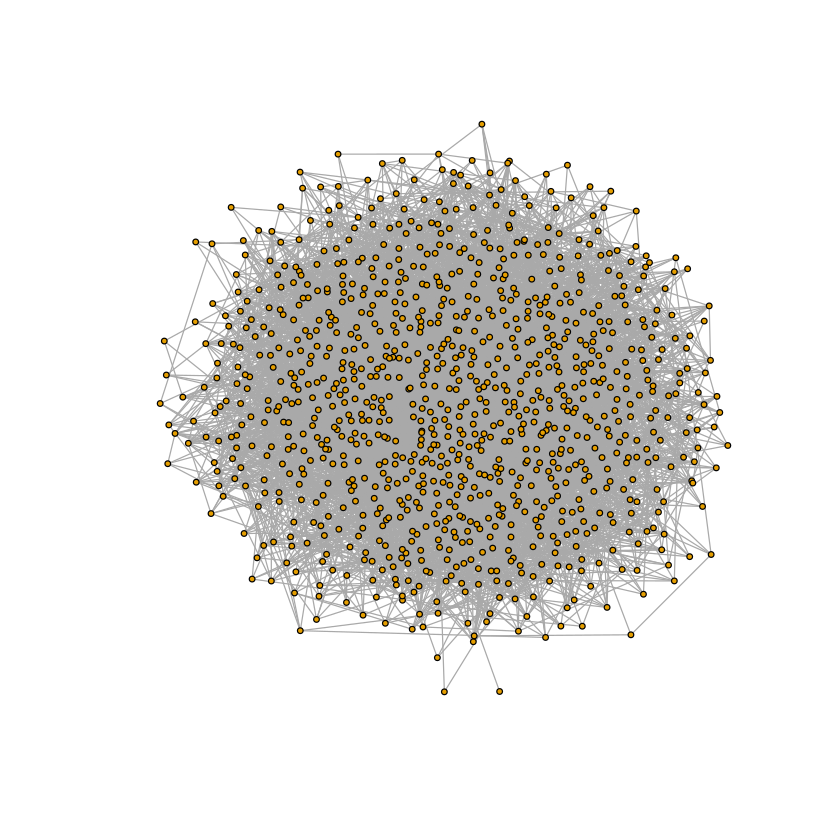

[1] "The mean of degree distribution is 9.81"
[1] "The variance of degree distribution is 9.4053053053053"
[1] "_________________________"
[1] "For probability 0.05"


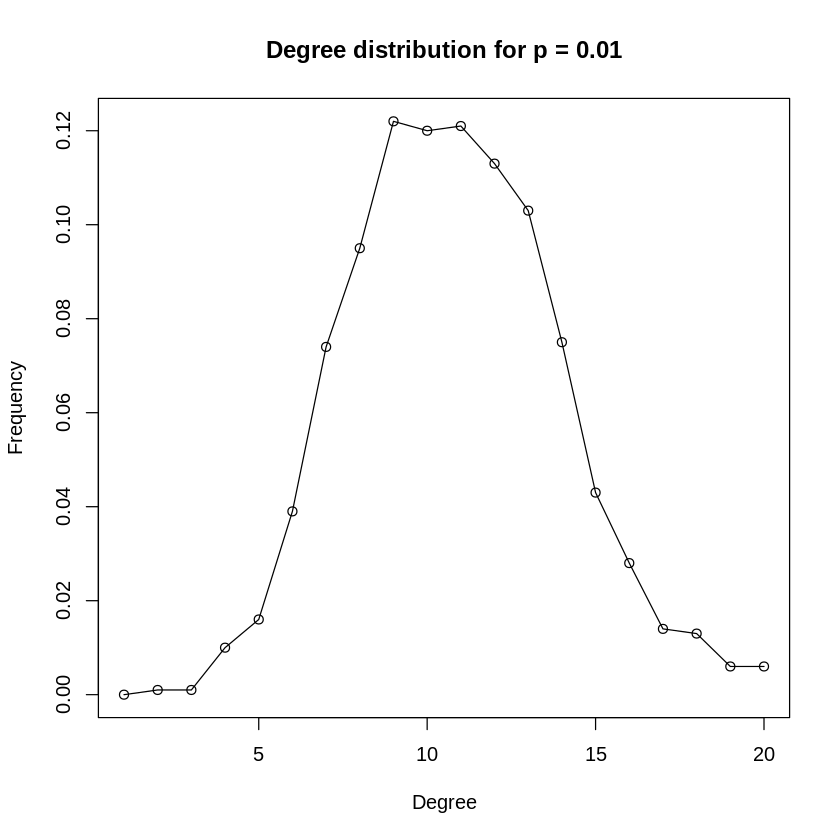

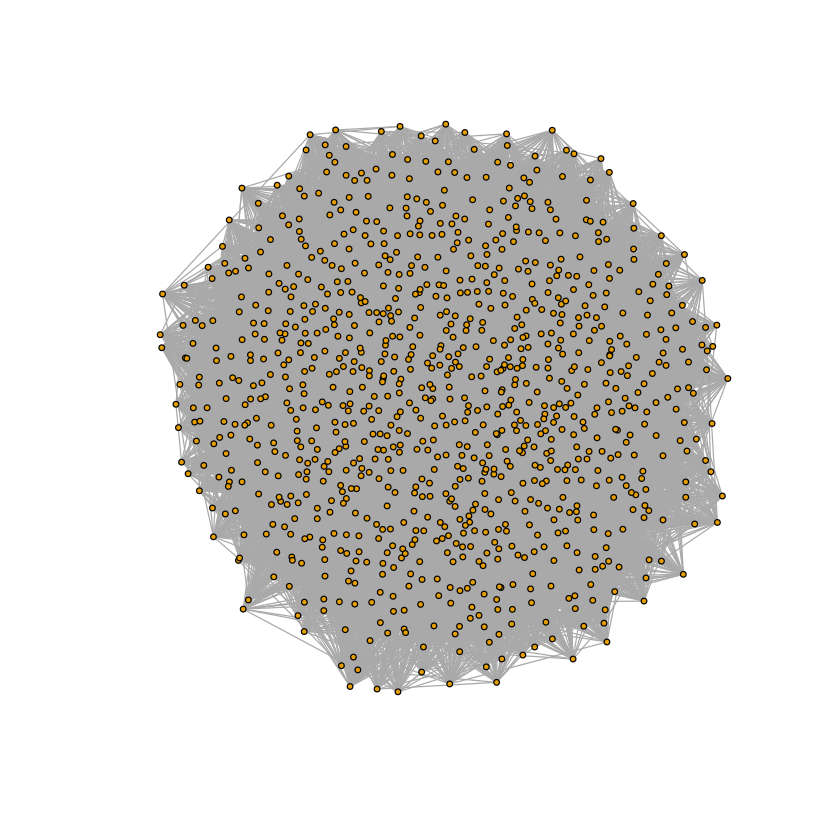

[1] "The mean of degree distribution is 49.708"
[1] "The variance of degree distribution is 46.4491851851852"
[1] "_________________________"
[1] "For probability 0.1"


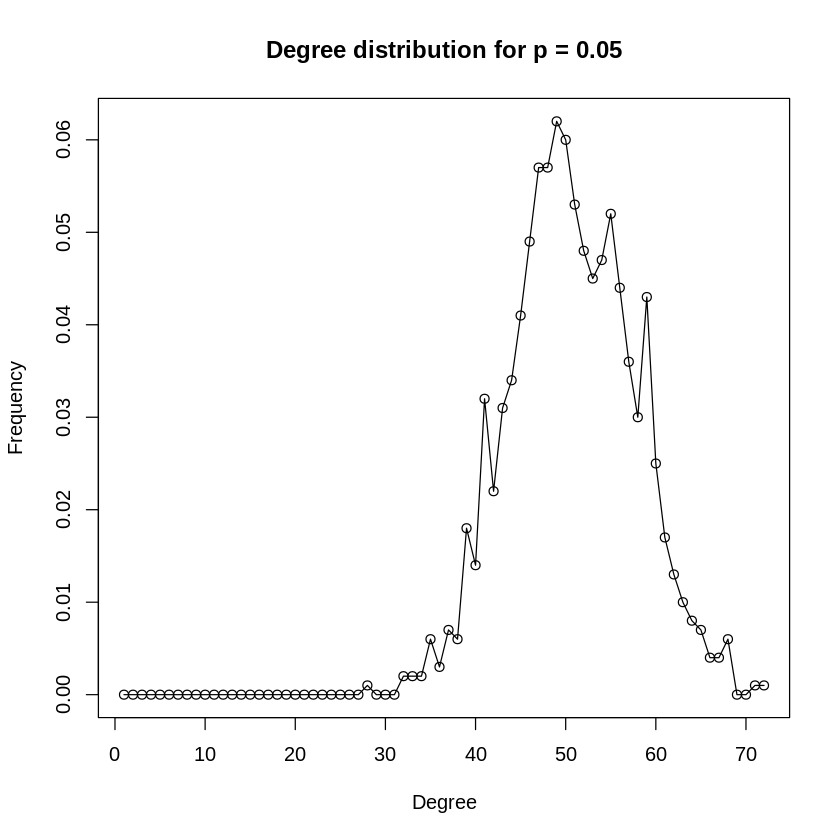

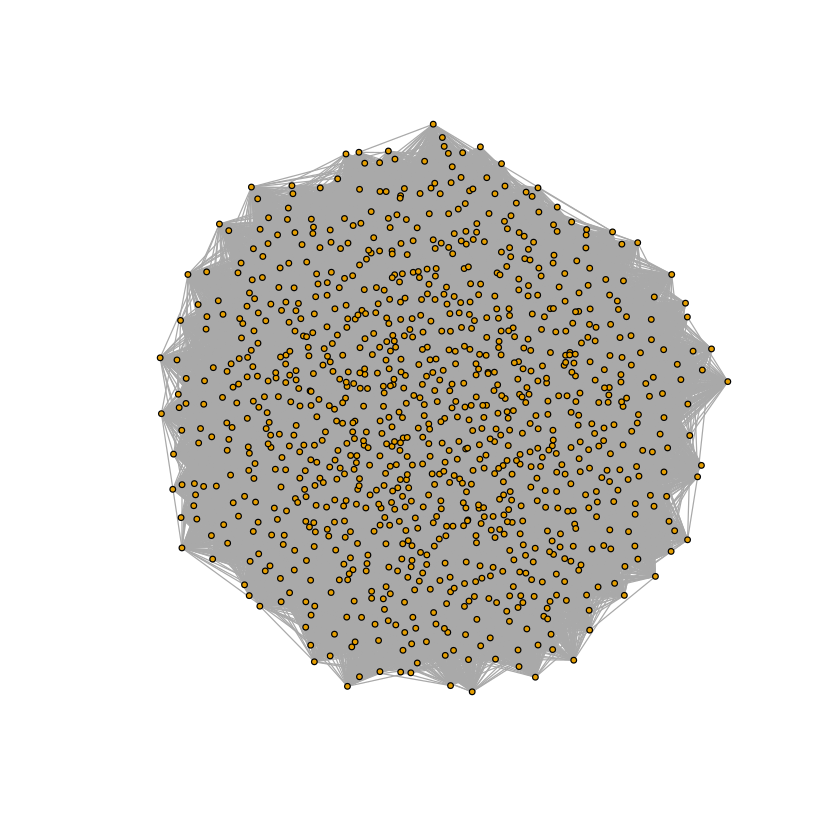

[1] "The mean of degree distribution is 101.024"
[1] "The variance of degree distribution is 91.7071311311311"
[1] "_________________________"


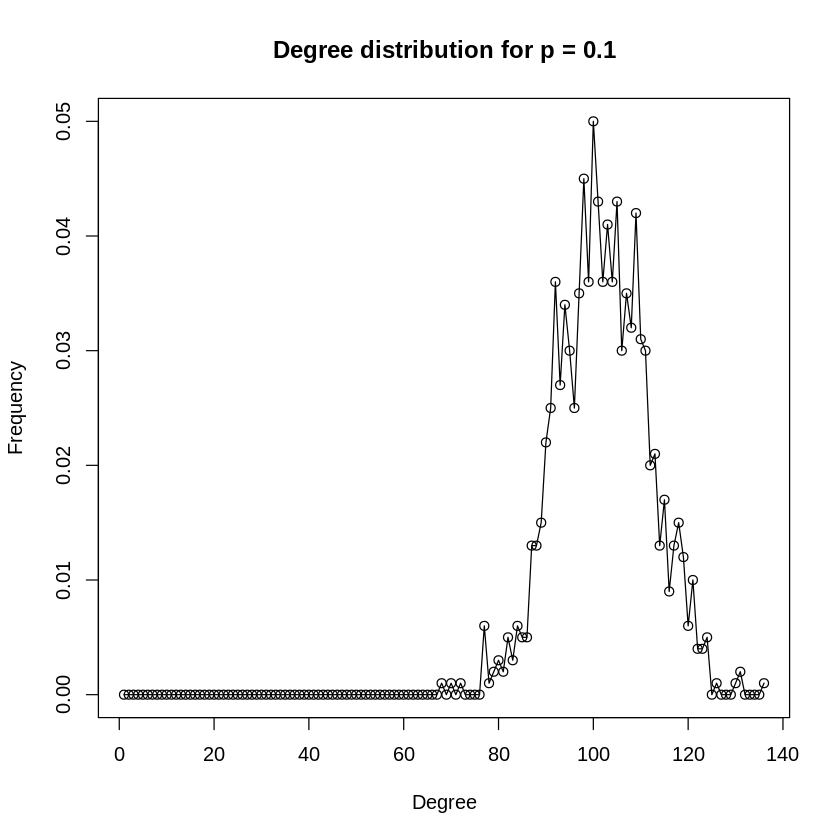

In [55]:
#Q1-1(a)
prob = c(0.003,0.004,0.01,0.05,0.1)
for (p in prob){
    er = erdos.renyi.game(1000, p=p, directed = F)

    print(paste('For probability', p))
    plot(er, vertex.size=2, vertex.label=NA)
    plot(degree.distribution(er), type = 'o', main=paste("Degree distribution for p =", p), xlab = "Degree", ylab = "Frequency") 
    print(paste('The mean of degree distribution is', mean(degree(er))))
    print(paste('The variance of degree distribution is', var(degree(er))))
    print("_________________________")
}

[1] "For probability 0.003"
[1] "Connected:  FALSE"
[1] "Probability that a generated network is connected:  0"
[1] "The diameter of GCC is 14"
[1] "_________________________"
[1] "For probability 0.004"
[1] "Connected:  FALSE"
[1] "Probability that a generated network is connected:  0"


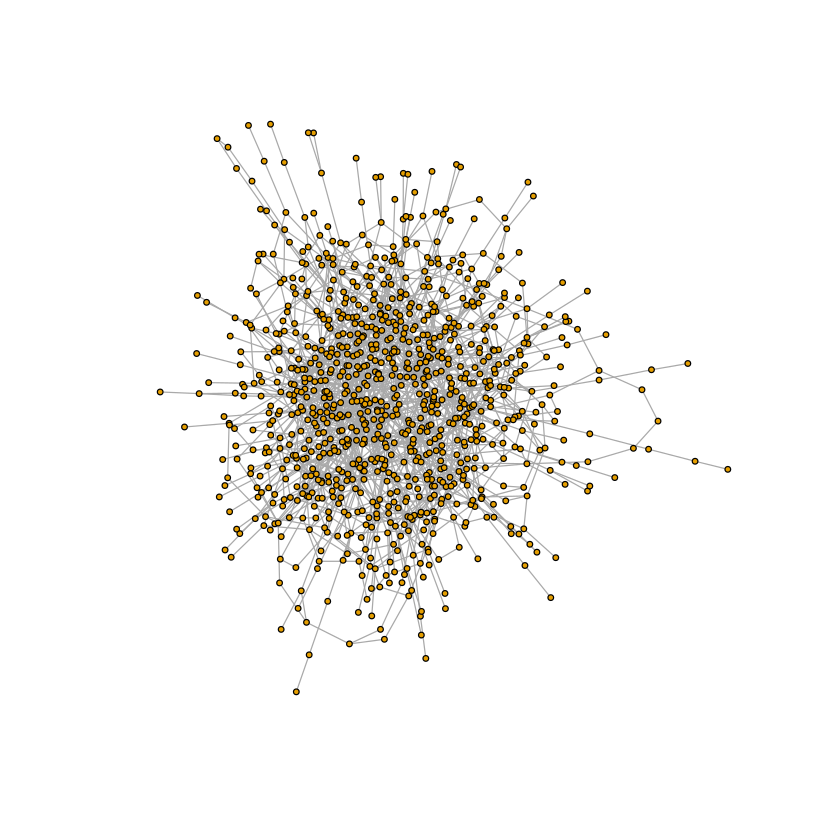

[1] "The diameter of GCC is 11"
[1] "_________________________"
[1] "For probability 0.01"
[1] "Connected:  TRUE"
[1] "Probability that a generated network is connected:  0.957"


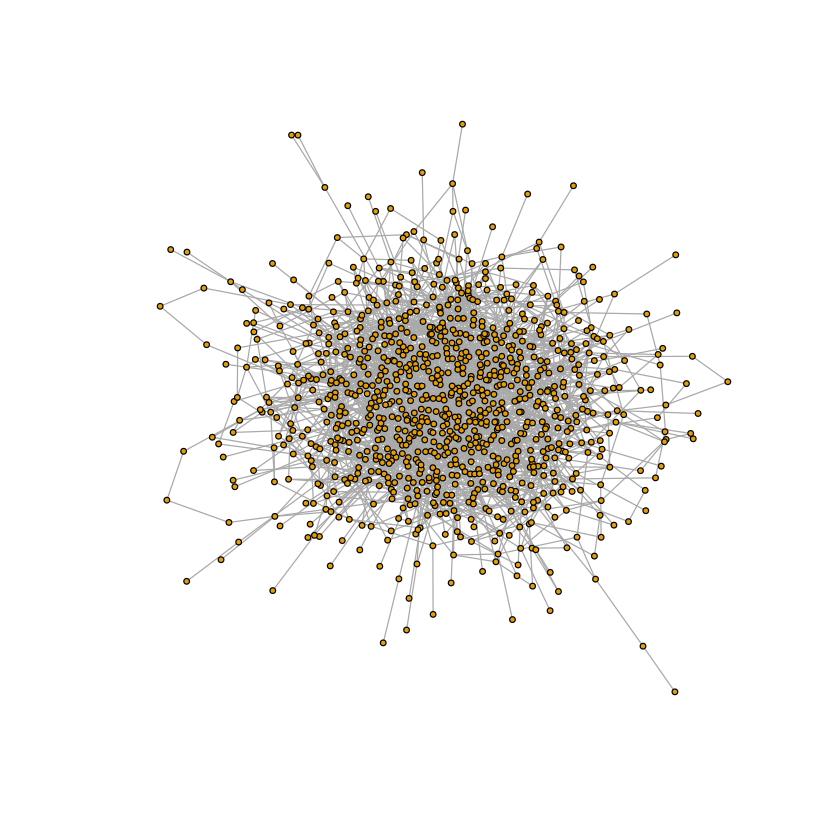

[1] "The diameter of GCC is 5"
[1] "_________________________"
[1] "For probability 0.05"
[1] "Connected:  TRUE"
[1] "Probability that a generated network is connected:  1"


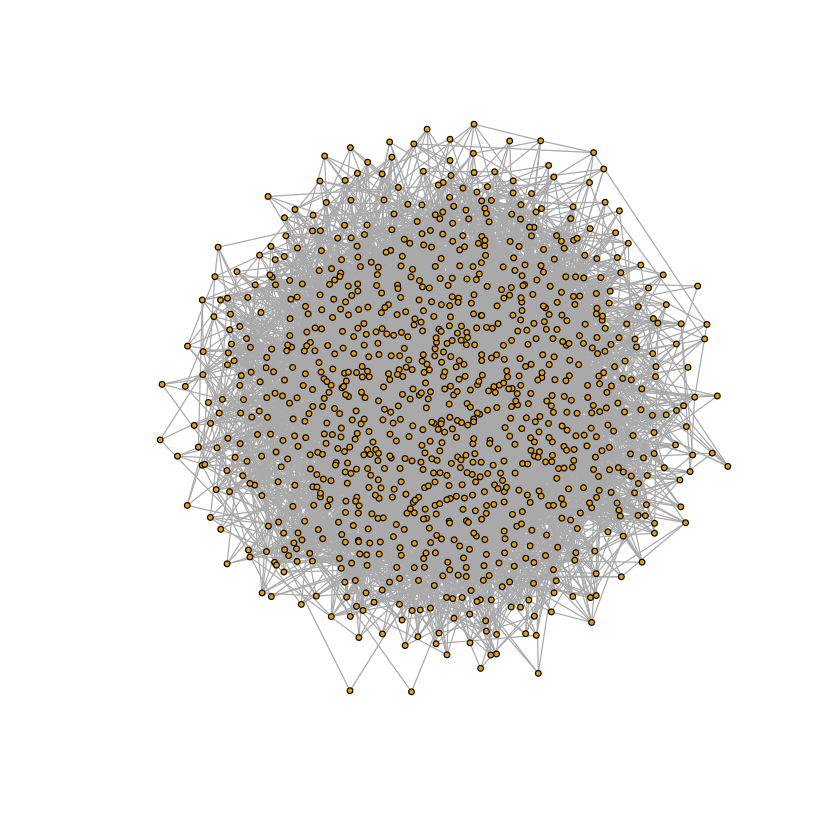

[1] "The diameter of GCC is 3"
[1] "_________________________"
[1] "For probability 0.1"
[1] "Connected:  TRUE"
[1] "Probability that a generated network is connected:  1"


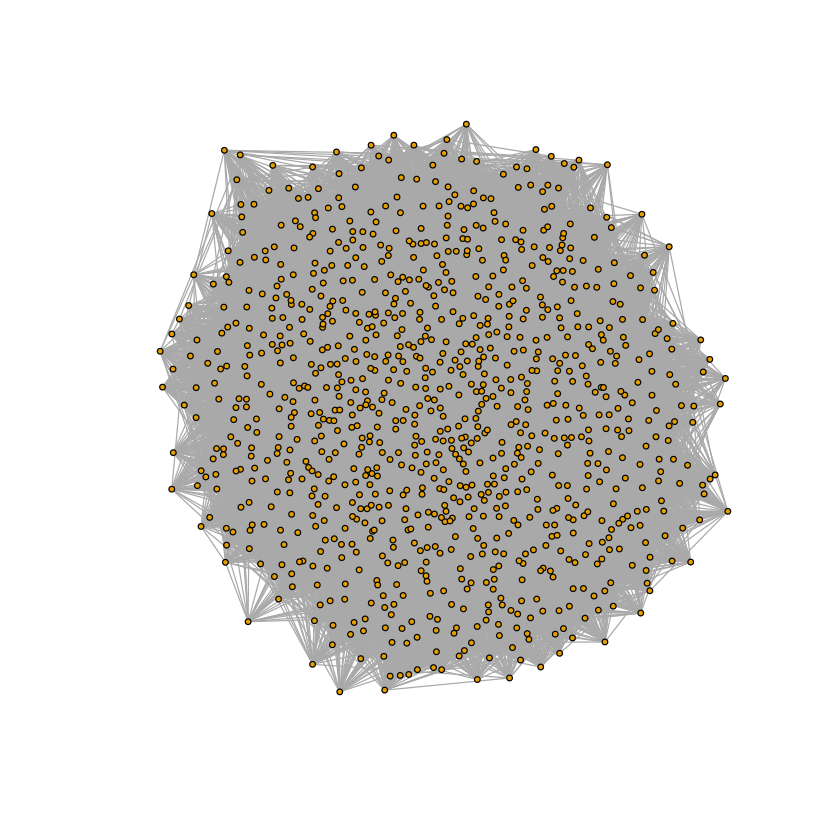

[1] "The diameter of GCC is 3"
[1] "_________________________"


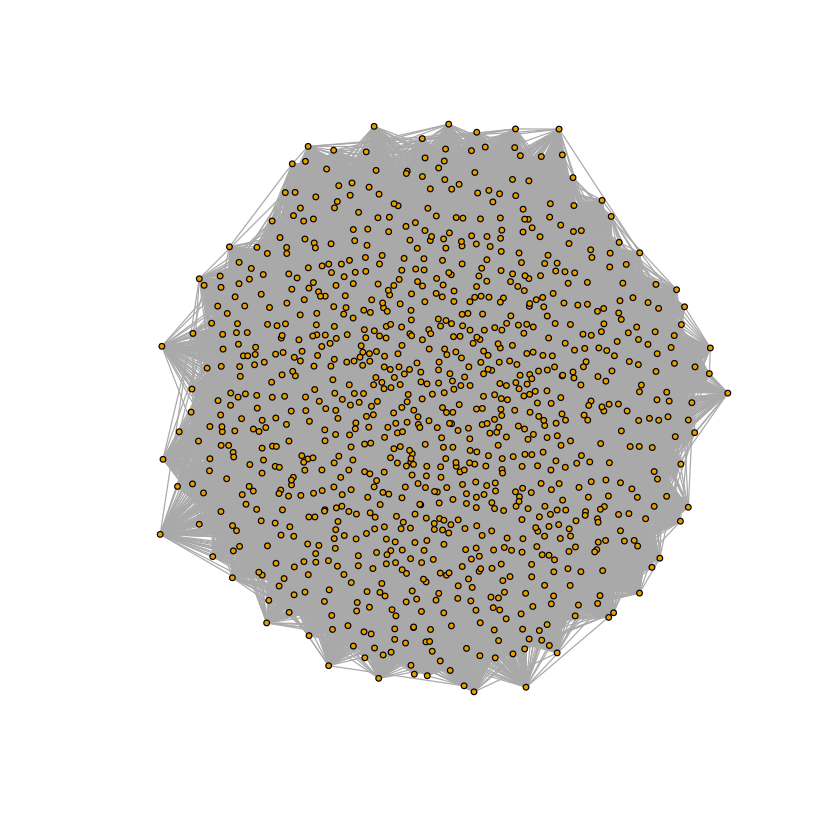

In [56]:
#Q1-1(b)
Connect_Prob <- function(prob){
  count <- 0
  for (iter in 1:1000){
    er = erdos.renyi.game(1000, p = prob, directed=F)
    if (is.connected(er)){
        count <- count + 1
        }
  }
  count/1000
}

for (p in prob){
    er = erdos.renyi.game(1000, p=p, directed = F)

    print(paste('For probability', p))
    print(paste('Connected: ', is.connected(er)))
    print(paste('Probability that a generated network is connected: ', Connect_Prob(p)))
    gcc <- induced.subgraph(er, which(clusters(er)$membership == which.max(clusters(er)$csize)))
    plot(gcc, vertex.size=2, vertex.label=NA)
    print(paste('The diameter of GCC is', diameter(gcc)))
    print("_________________________")
}

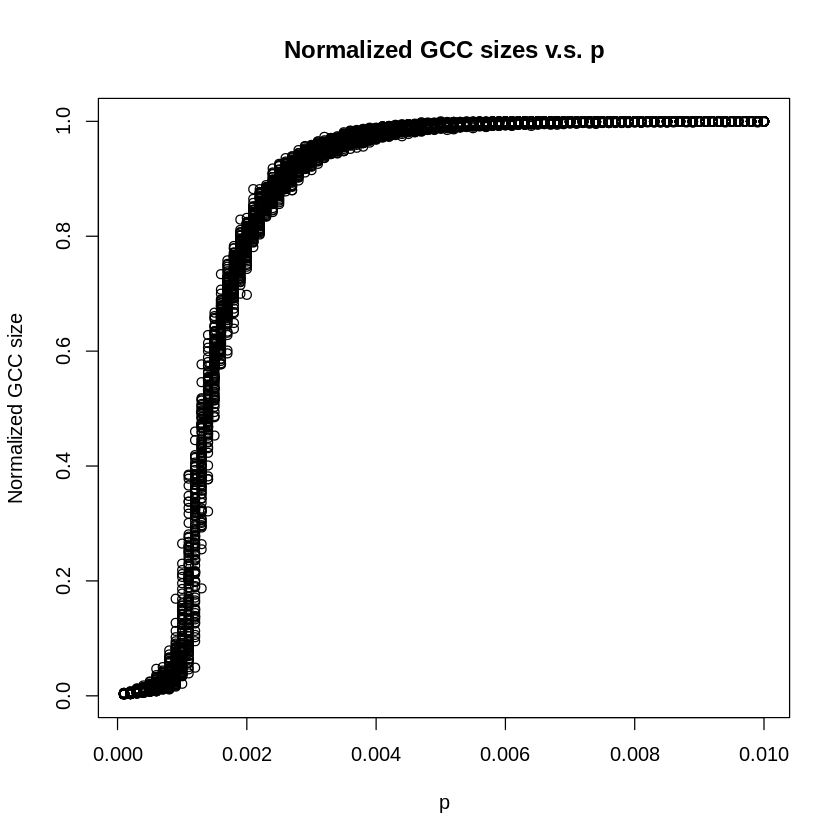

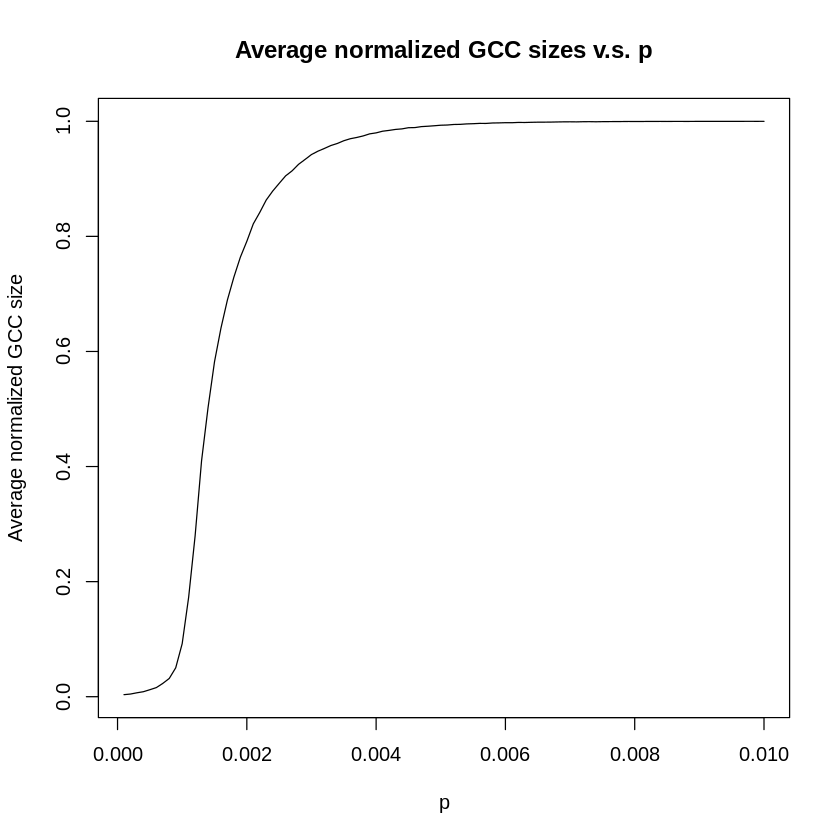

In [4]:
#Q1-1(c)
prob <- seq(0.0001,0.01,0.0001)
prob_list <- c()
gcc_size_list <- c()
gcc_norm <- c()
for (p in prob) {
  gcc_size <- 0
  for (iter in 1:100){
    er = erdos.renyi.game(1000, p = p, directed=F)
    gcc <- induced.subgraph(er, which(clusters(er)$membership == which.max(clusters(er)$csize)))
    cur_gcc_size = length(V(gcc))/1000
    gcc_size <- gcc_size + cur_gcc_size
    prob_list <- c(prob_list, p)
    gcc_size_list <- c(gcc_size_list, cur_gcc_size)
  }
  gcc_norm <- c(gcc_norm,(gcc_size/100))
}
plot(prob_list,gcc_size_list, main='Normalized GCC sizes v.s. p', xlab = 'p', ylab = 'Normalized GCC size')
plot(prob,gcc_norm, type='l', main='Average normalized GCC sizes v.s. p', xlab = 'p', ylab = 'Average normalized GCC size')

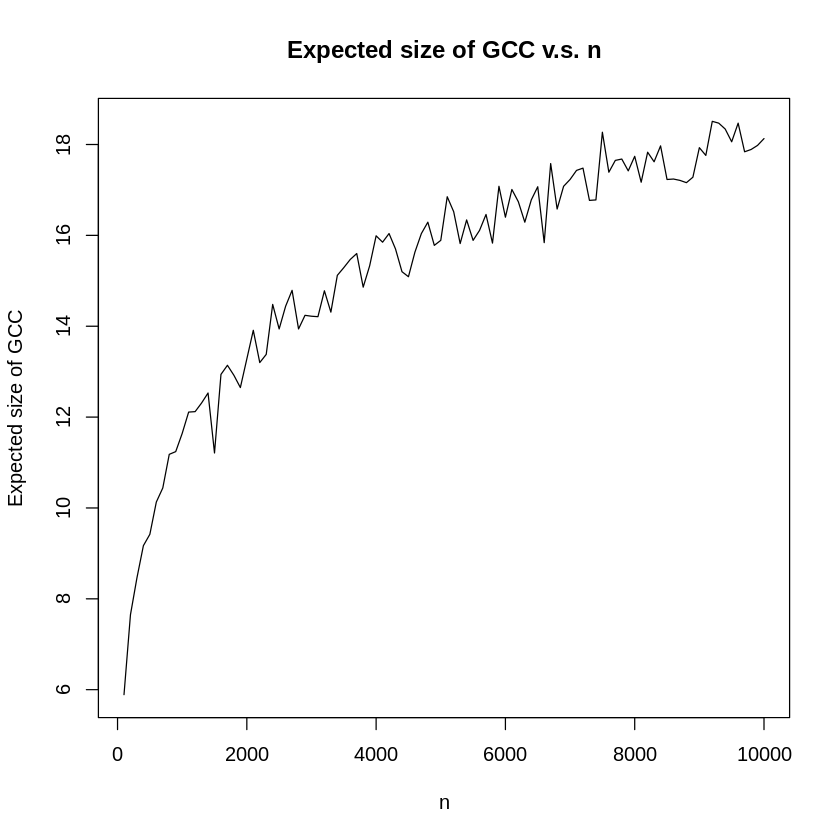

In [26]:
#Q1-1(d)(i)
c <- 0.5
avg_gcc_size <- c()
nodes <- seq(100, 10000, 100)
for(n in nodes){
    p <- c/n
    gcc_size <- 0
    
    for (iter in 1:100){
    er = erdos.renyi.game(n = n, p = p, directed=F)
    gcc <- induced.subgraph(er, which(clusters(er)$membership == which.max(clusters(er)$csize)))
    cur_gcc_size = length(V(gcc))
    gcc_size <- gcc_size + cur_gcc_size
    }
    avg_gcc_size <- c(avg_gcc_size, (gcc_size/100)) 
}
plot(nodes, avg_gcc_size, type='l', main='Expected size of GCC v.s. n', xlab='n', ylab='Expected size of GCC')

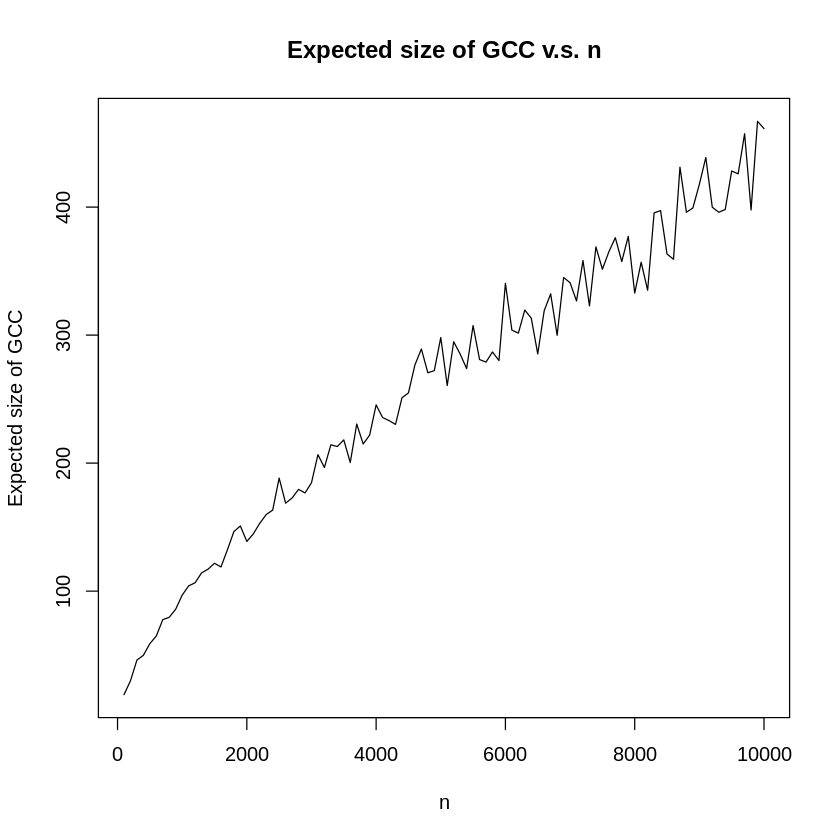

In [27]:
#Q1-1(d)(ii)
c <- 1
avg_gcc_size <- c()
nodes <- seq(100, 10000, 100)
for(n in nodes){
    p <- c/n
    gcc_size <- 0
    
    for (iter in 1:100){
    er = erdos.renyi.game(n = n, p = p, directed=F)
    gcc <- induced.subgraph(er, which(clusters(er)$membership == which.max(clusters(er)$csize)))
    cur_gcc_size = length(V(gcc))
    gcc_size <- gcc_size + cur_gcc_size
    }
    avg_gcc_size <- c(avg_gcc_size, (gcc_size/100)) 
}
plot(nodes, avg_gcc_size, type='l', main='Expected size of GCC v.s. n', xlab='n', ylab='Expected size of GCC')

In [0]:
#Q1-1(d)(iii)
c1 = 1.1
c2 = 1.2
c3 = 1.3 
avg_gcc_size_1 <- c()
avg_gcc_size_2 <- c()
avg_gcc_size_3 <- c()
nodes <- seq(100, 10000, 100)

# c = 1.1
for(n in nodes){
    p <- c1/n
    gcc_size <- 0
    
    for (iter in 1:100){
    er = erdos.renyi.game(n = n , p = p, directed=F)
    gcc <- induced.subgraph(er, which(clusters(er)$membership == which.max(clusters(er)$csize)))
    cur_gcc_size = length(V(gcc))
    gcc_size <- gcc_size + cur_gcc_size
    }
    avg_gcc_size_1 <- c(avg_gcc_size_1, (gcc_size/100))  
}

# c = 1.2
for(n in nodes){
    p <- c2/n
    gcc_size <- 0
    
    for (iter in 1:100){
    er = erdos.renyi.game(n = n , p = p, directed=F)
    gcc <- induced.subgraph(er, which(clusters(er)$membership == which.max(clusters(er)$csize)))
    cur_gcc_size = length(V(gcc))
    gcc_size <- gcc_size + cur_gcc_size
    }
    avg_gcc_size_2 <- c(avg_gcc_size_2, (gcc_size/100))  
}

# c = 1.3
for(n in nodes){
    p <- c3/n
    gcc_size <- 0
    
    for (iter in 1:100){
    er = erdos.renyi.game(n = n , p = p, directed=F)
    gcc <- induced.subgraph(er, which(clusters(er)$membership == which.max(clusters(er)$csize)))
    cur_gcc_size = length(V(gcc))
    gcc_size <- gcc_size + cur_gcc_size
    }
    avg_gcc_size_3 <- c(avg_gcc_size_3, (gcc_size/100))  
}

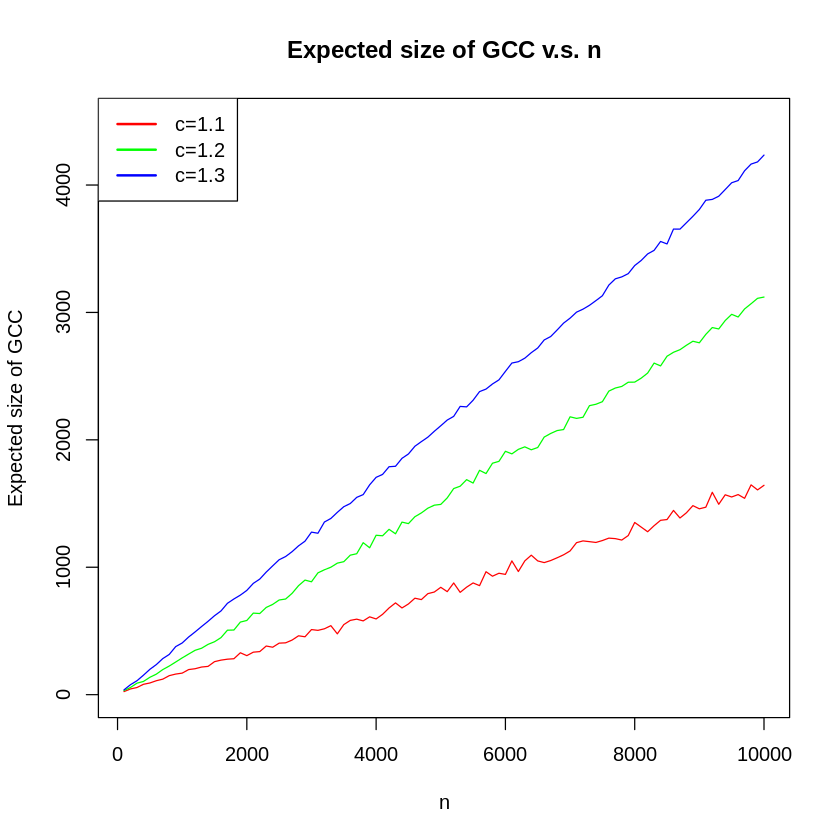

In [48]:
plot(nodes, avg_gcc_size_1, type='l', main='Expected size of GCC v.s. n', xlab='n', ylab='Expected size of GCC', ylim = c(0,4500), col = "red")
lines(nodes, avg_gcc_size_2, col = "green")
lines(nodes, avg_gcc_size_3, col = "blue")

legend("topleft",legend=c("c=1.1","c=1.2","c=1.3"),col=c("red","green","blue"),  lty=1,lwd=2) 

In [0]:
#Q1-2
#Some functions
pa_modularity = function(pa, n){
    com_str = cluster_fast_greedy(pa)  
    print(paste("Modularity: ", modularity(pa, membership(com_str))))
}

[1] TRUE


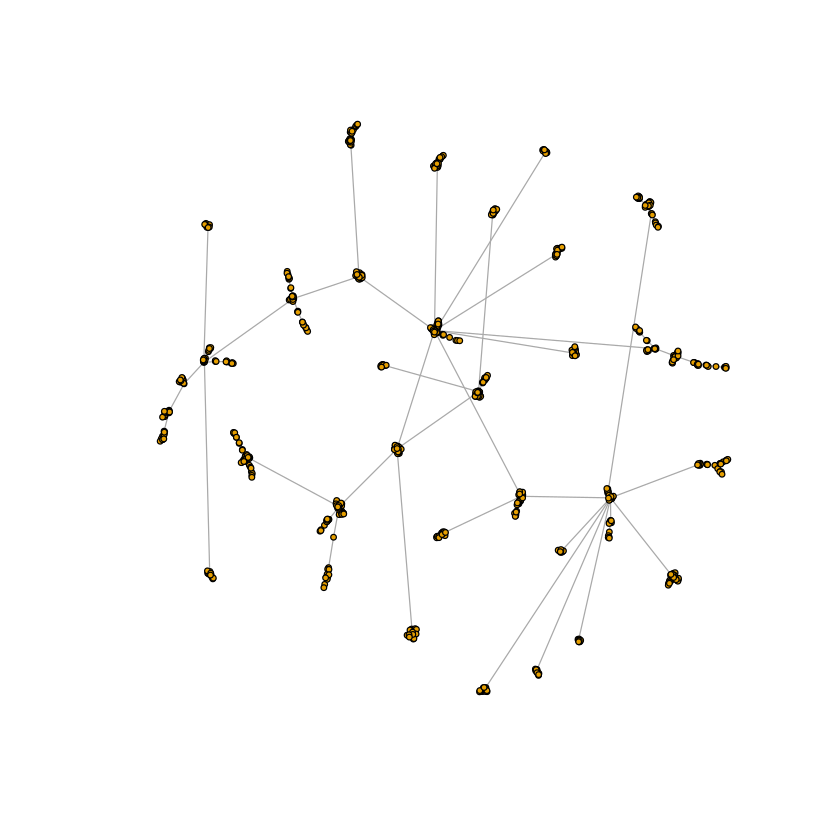

In [3]:
#Q1-2(a)
pa = barabasi.game(1000, m=1, directed=F)
print(is.connected(pa))

plot(pa, vertex.size=2, vertex.label=NA)

[1] "Modularity:  0.933120808496184"


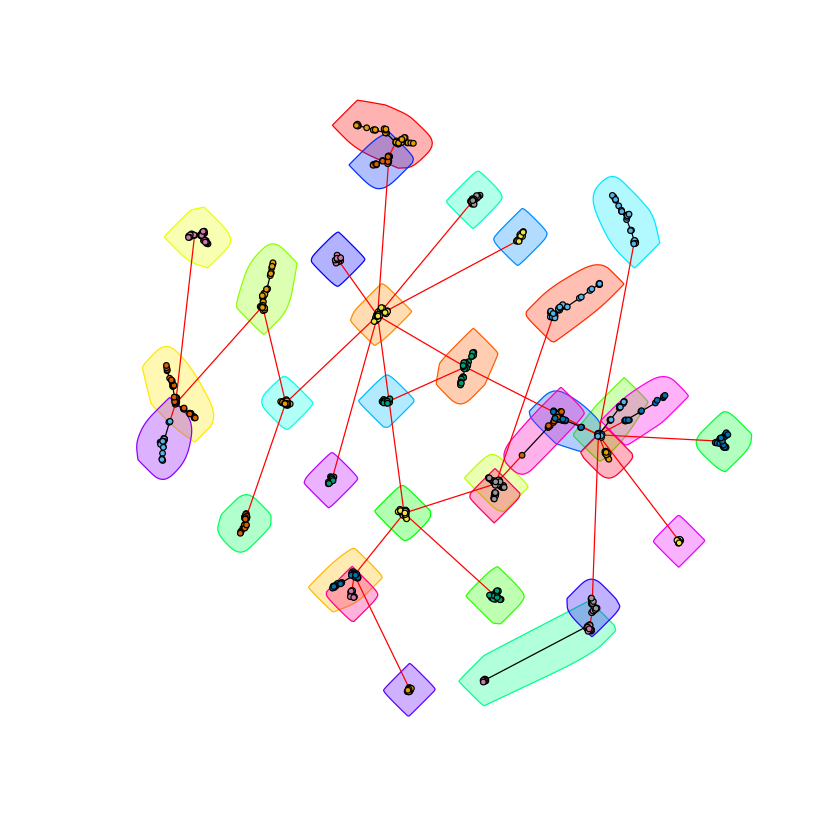

In [4]:
#Q1-2(b)
pa_modularity(pa, n = 1000)
plot(fastgreedy.community(pa), pa, vertex.size=2, vertex.label=NA)

[1] "Modularity:  0.978329491114928"


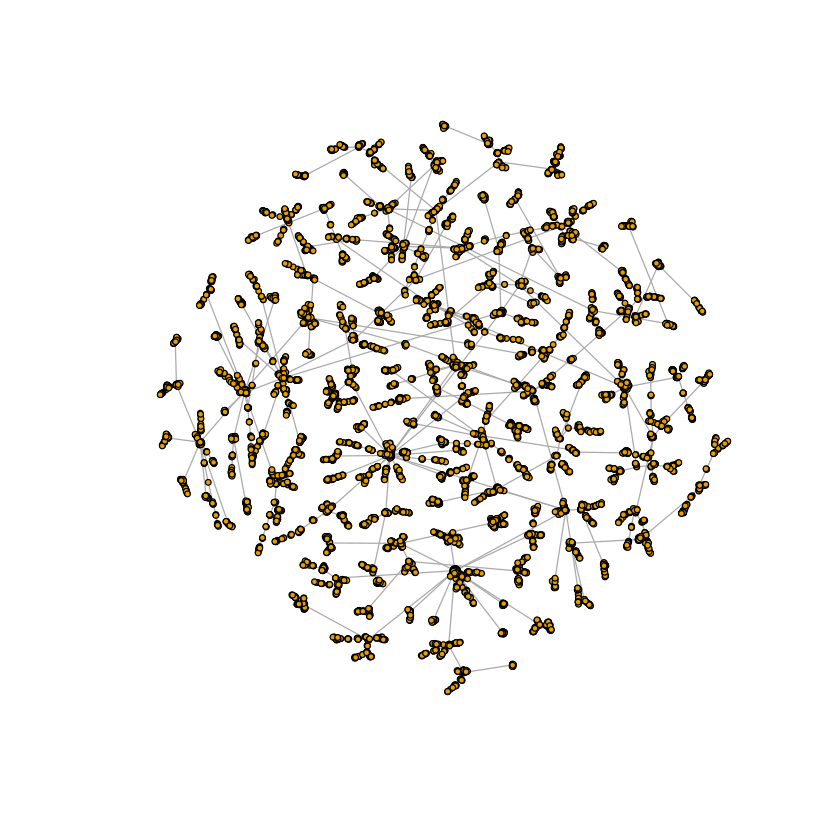

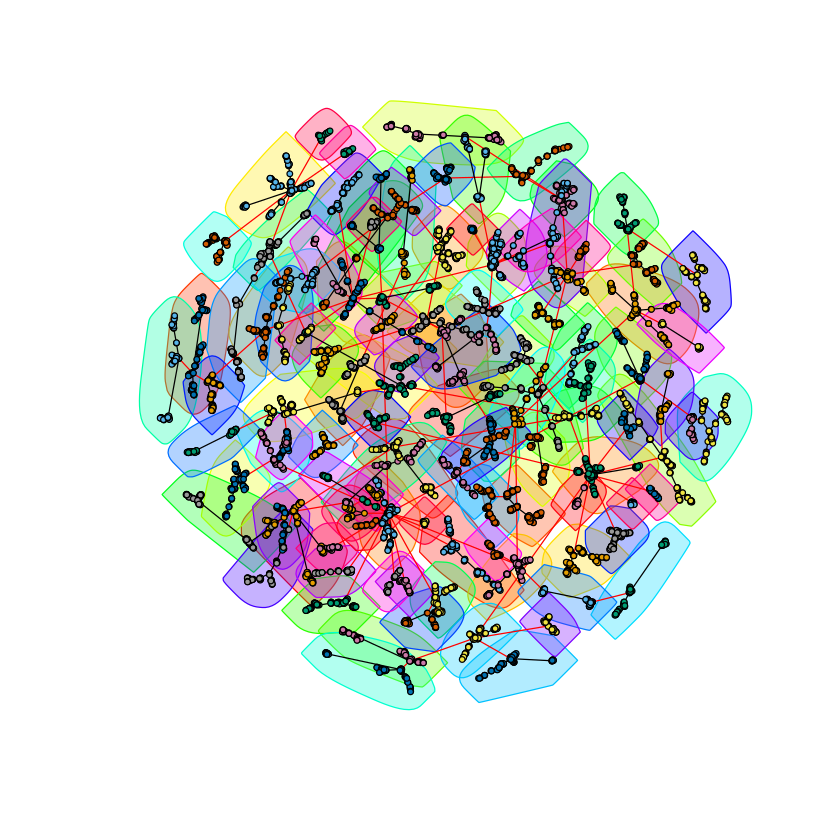

In [6]:
#Q1-2(c)
pa_large = barabasi.game(10000, m=1, directed=F)
pa_modularity(pa_large, n = 10000)
plot(pa_large, vertex.size=2, vertex.label=NA)
plot(fastgreedy.community(pa_large), pa_large, vertex.size=2, vertex.label=NA)


Call:
lm(formula = log(probability) ~ log(degree))

Coefficients:
(Intercept)  log(degree)  
    -0.1311      -2.4132  



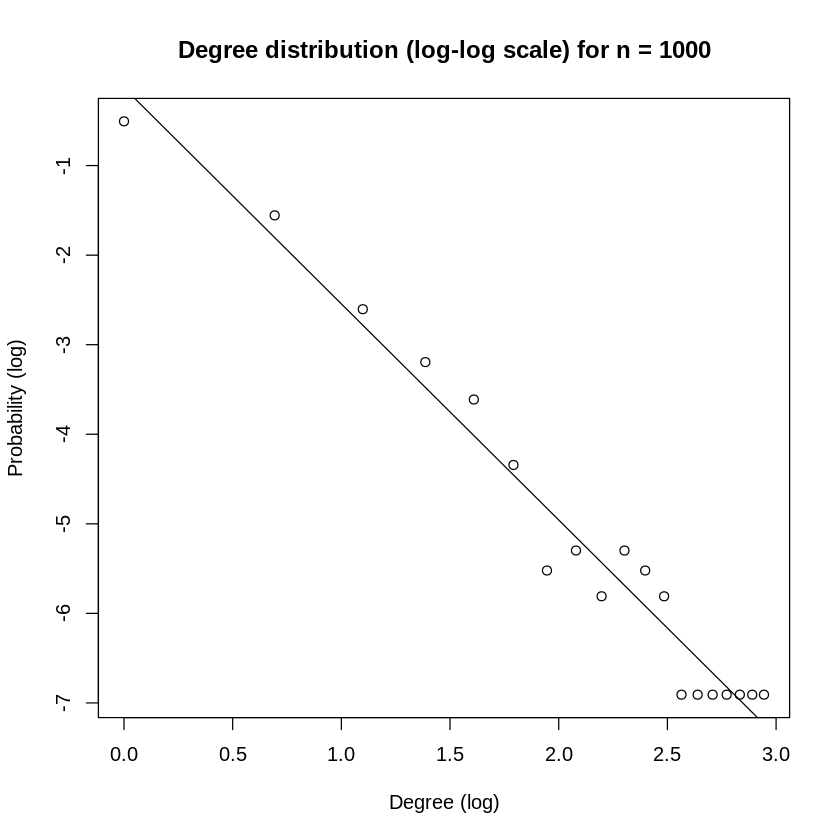


Call:
lm(formula = log(probability) ~ log(degree))

Coefficients:
(Intercept)  log(degree)  
     0.3137      -2.7350  



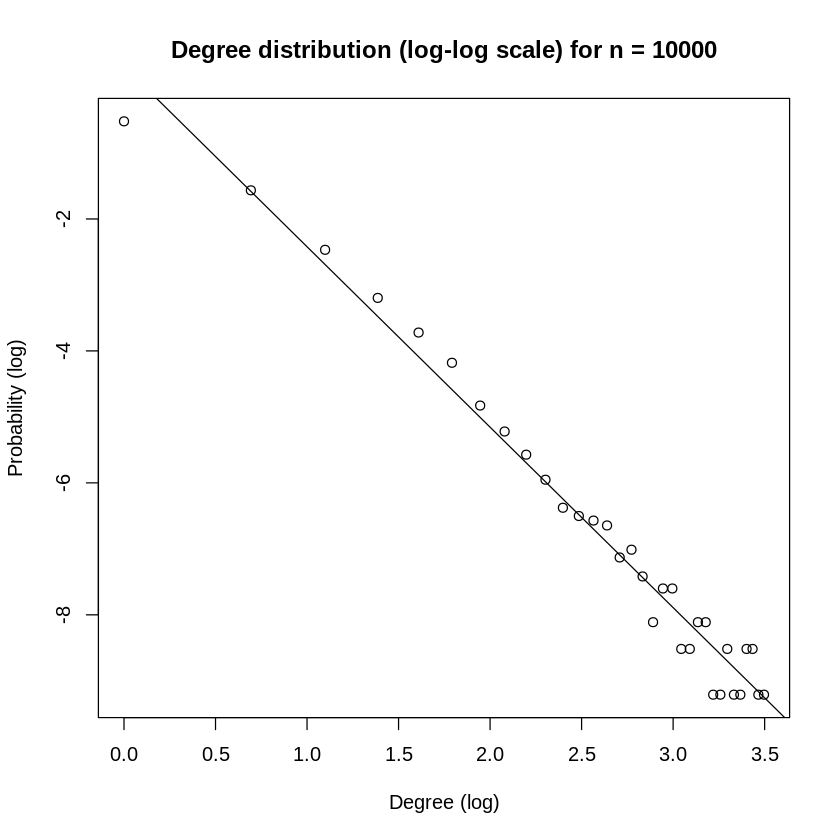

In [6]:
#Q1-2(d)
pa_log <- function(pa, n){
    probability = degree.distribution(pa)
    degree = c(1:length(probability))
    
    # delete zero values
    probability = probability[which(probability != 0)]
    degree = degree[which(probability != 0)]

    plot(log(degree), 
         log(probability), 
         main=paste("Degree distribution (log-log scale) for n =", n),
         xlab = "Degree (log)", 
         ylab = "Probability (log)") 

    linearMod <- lm(log(probability) ~ log(degree))  
    print(linearMod)
    abline(linearMod)
}

pa_log(pa, n = 1000)
pa_log(pa_large, n = 10000)

In [0]:
#Q1-2(e)
pa_neighbors <- function(pa, n){
    degree_j = c()
    for (i in 1:n) {
        rand_i = sample(n, 1)
        i_neighbors = neighbors(pa, rand_i)
        
        if (length(i_neighbors) > 0) {
            rand_j = sample(length(i_neighbors), 1)
            degree_j = c(degree_j, degree(pa, i_neighbors[rand_j]))
        }
    }
    degree_distribution = as.data.frame(table(degree_j))
    degree = log(as.numeric(degree_distribution$degree_j))
    probability = log(as.numeric(degree_distribution$Freq))

    # delete zero values
    probability = probability[which(probability != 0)]
    degree = degree[which(probability != 0)]

    plot(log(degree), 
         log(probability), 
         type = 'o',
         main=paste("Degree distribution (log-log scale) of nodes j for n =", n),
         xlab = "Degree (log)", 
         ylab = "Probability (log)") 

    # linearMod <- lm(log(probability) ~ log(degree)) 
    # print(linearMod)
    # abline(linearMod)
}

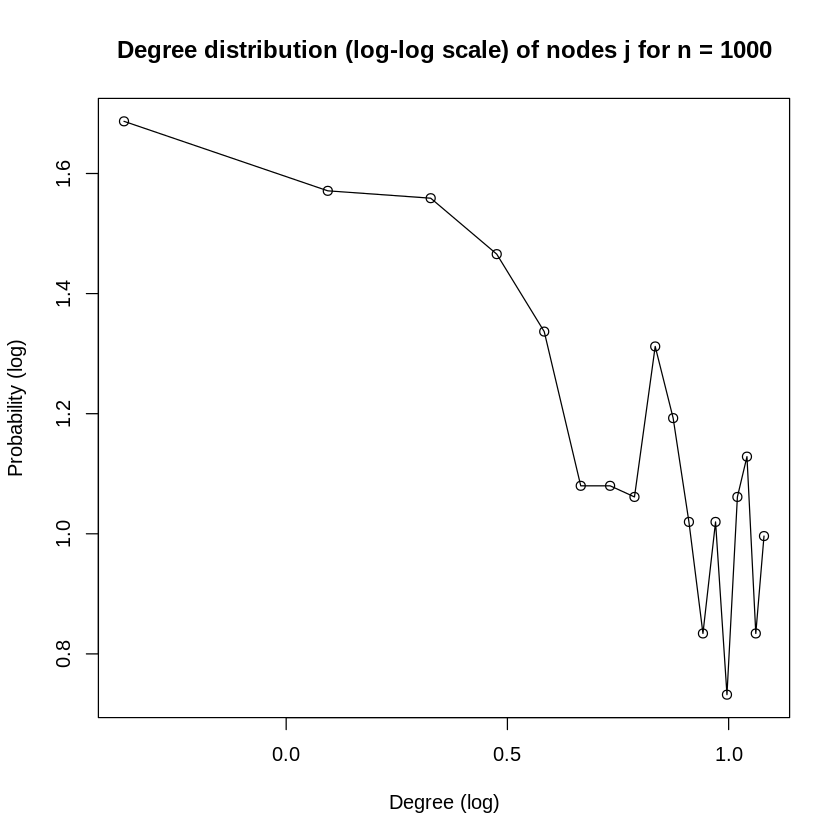

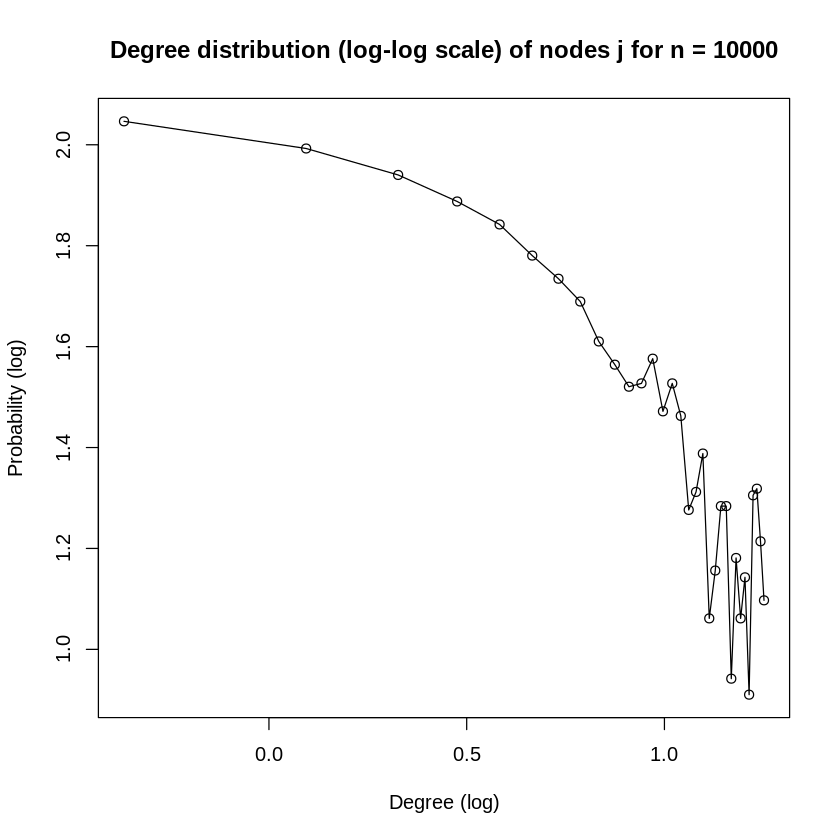

In [32]:
pa_neighbors(pa,1000)
pa_neighbors(pa_large,10000)

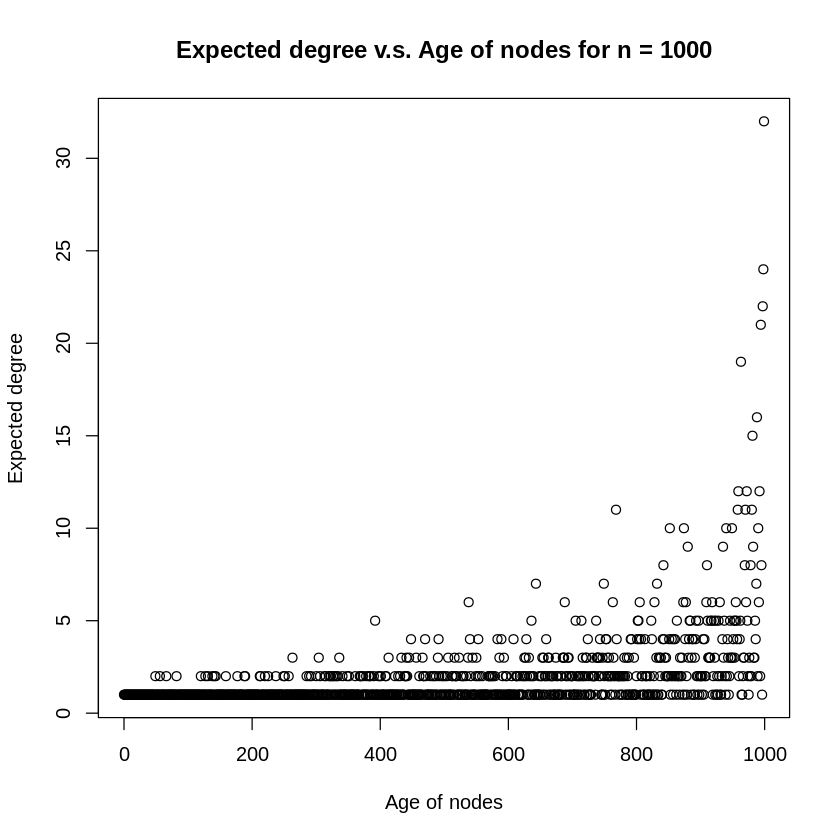

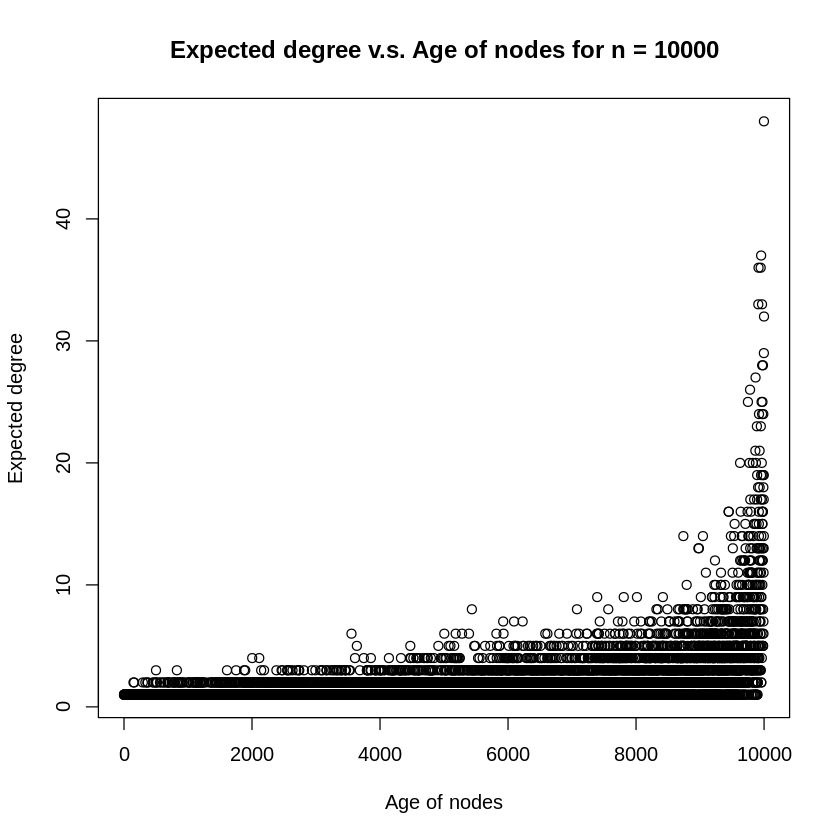

In [35]:
#Q1-2(f)
# n = 1000
n <- 1000
node_age = n - seq(1:n)
plot(node_age, degree(pa)[1:1000], main=paste("Expected degree v.s. Age of nodes for n =", n), xlab="Age of nodes", ylab="Expected degree")

# n = 10000
n <- 10000
node_age = n - seq(1:n)
plot(node_age, degree(pa_large)[1:10000], main=paste("Expected degree v.s. Age of nodes for n =", n), xlab="Age of nodes", ylab="Expected degree")

[1] TRUE


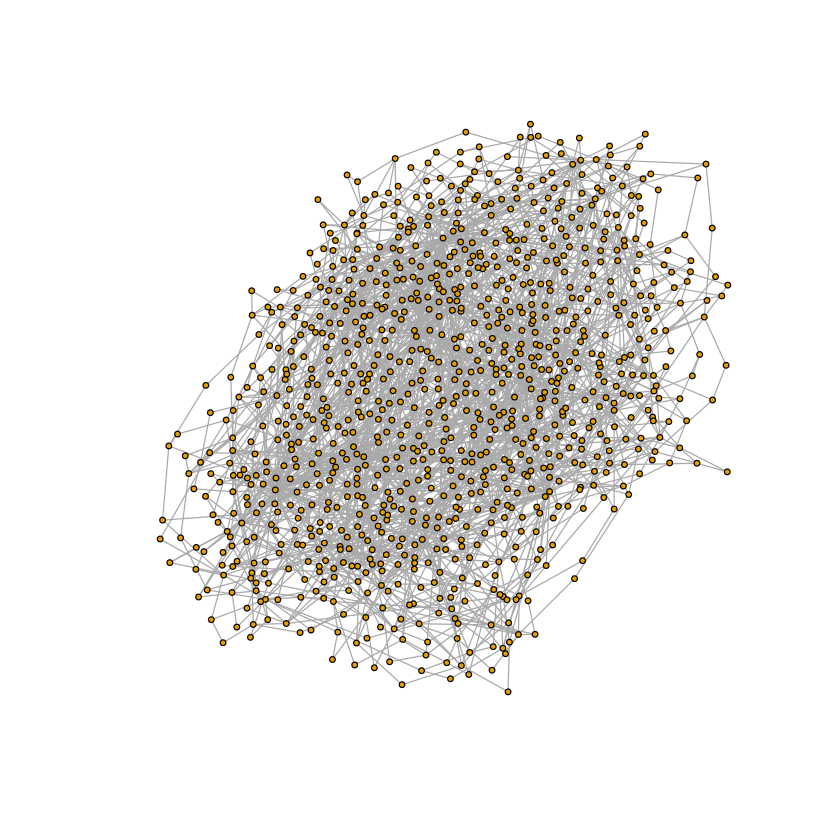

In [7]:
#Q1-2(g)
# m = 2 (a)
pa = barabasi.game(1000, m=2, directed=F)
print(is.connected(pa))

plot(pa, vertex.size=2, vertex.label=NA)

[1] "Modularity:  0.522925600218054"


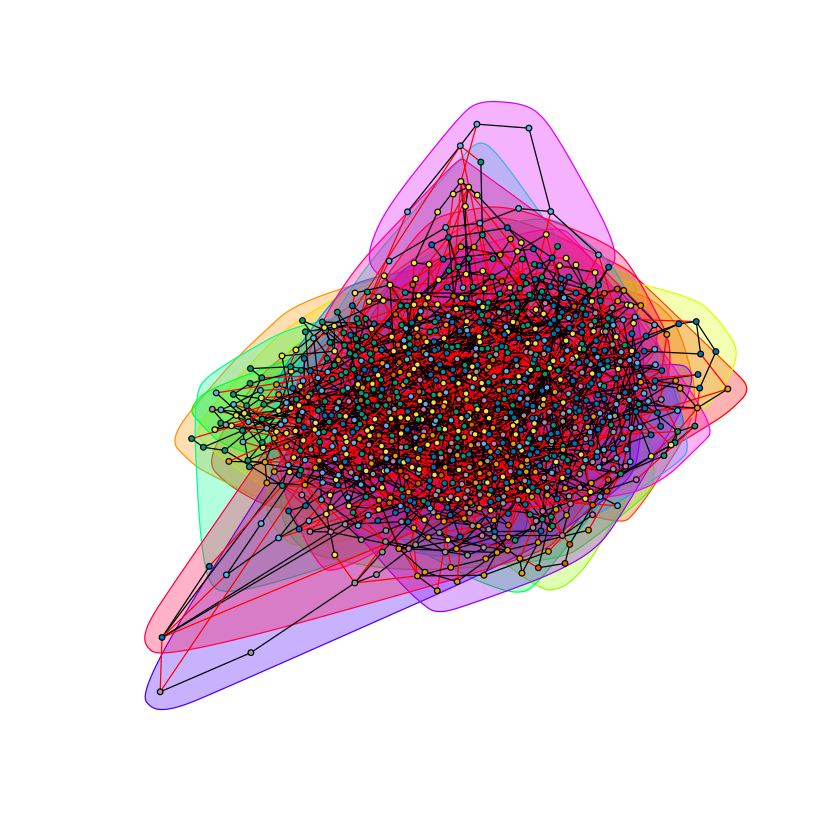

In [8]:
# m = 2 (b)
pa_modularity(pa, n = 1000)
plot(fastgreedy.community(pa), pa, vertex.size=2, vertex.label=NA)

[1] "Modularity:  0.531790545198272"


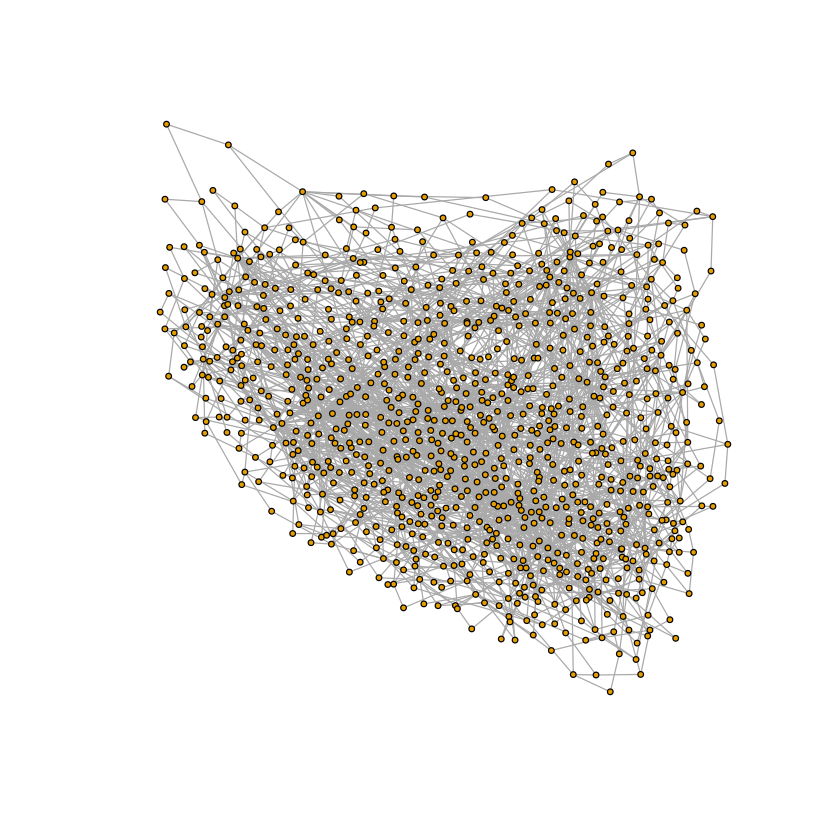

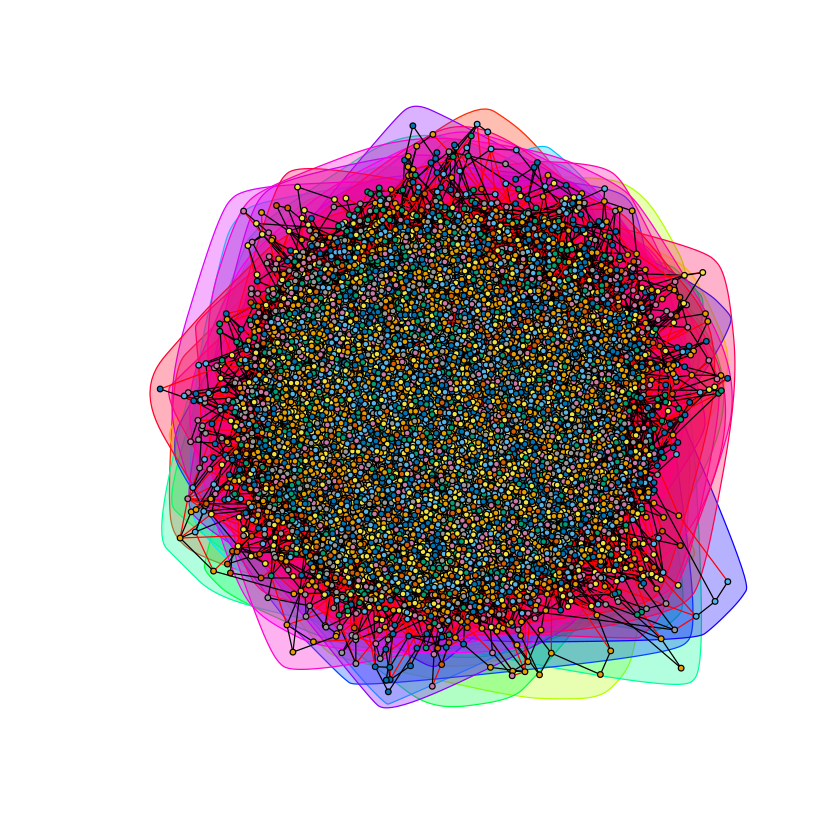

In [10]:
# m = 2 (c)
pa_large = barabasi.game(10000, m=2, directed=F)
pa_modularity(pa_large, n = 10000)
plot(pa, vertex.size=2, vertex.label=NA)
plot(fastgreedy.community(pa_large), pa_large, vertex.size=2, vertex.label=NA)


Call:
lm(formula = log(probability) ~ log(degree))

Coefficients:
(Intercept)  log(degree)  
    -0.2797      -2.0496  



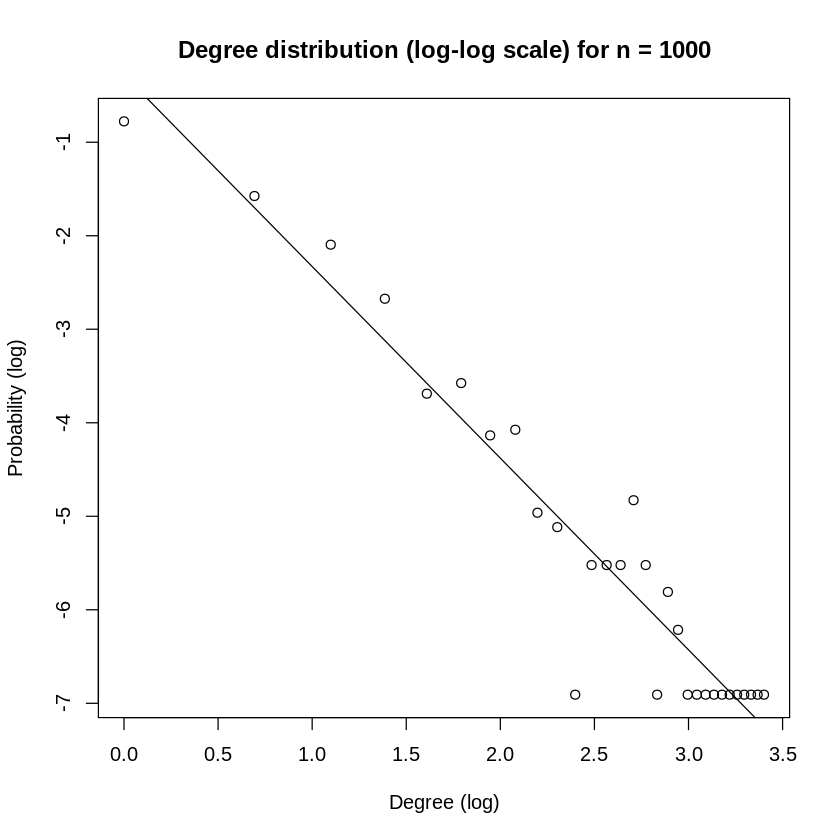


Call:
lm(formula = log(probability) ~ log(degree))

Coefficients:
(Intercept)  log(degree)  
     0.5841      -2.5229  



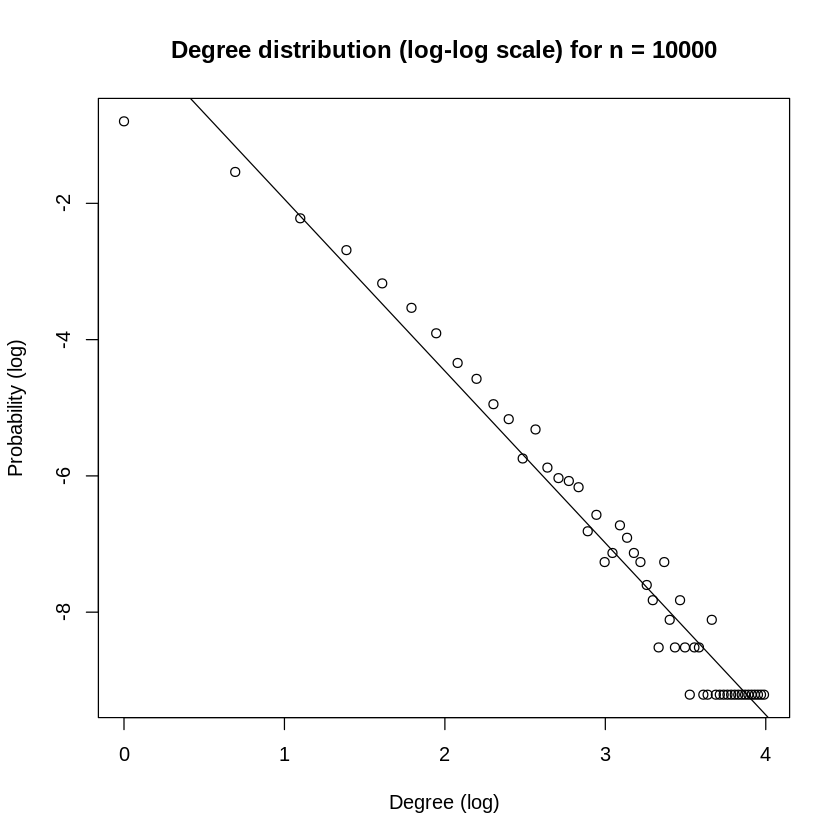

In [39]:
# m = 2 (d)
pa_log(pa, n = 1000)
pa_log(pa_large, n = 10000)

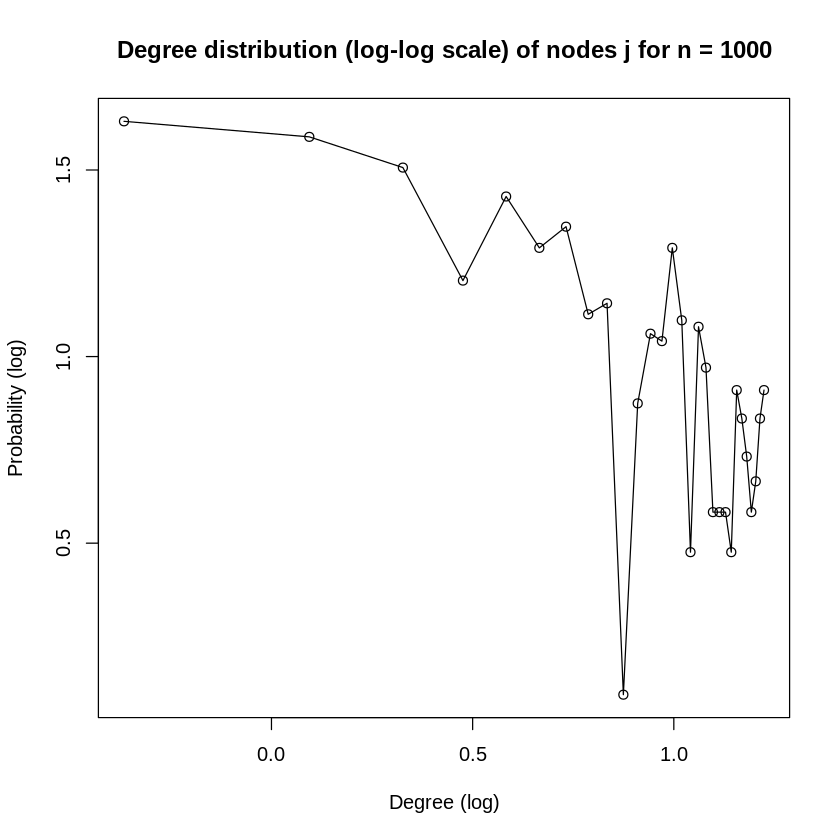

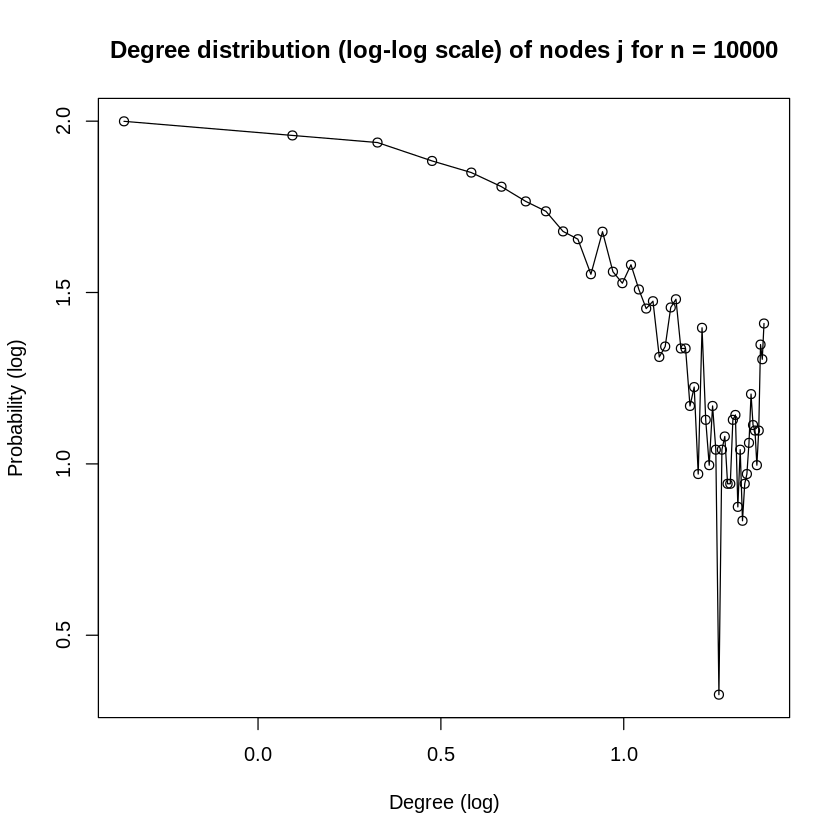

In [40]:
# m = 2 (e)
pa_neighbors(pa,1000)
pa_neighbors(pa_large,10000)

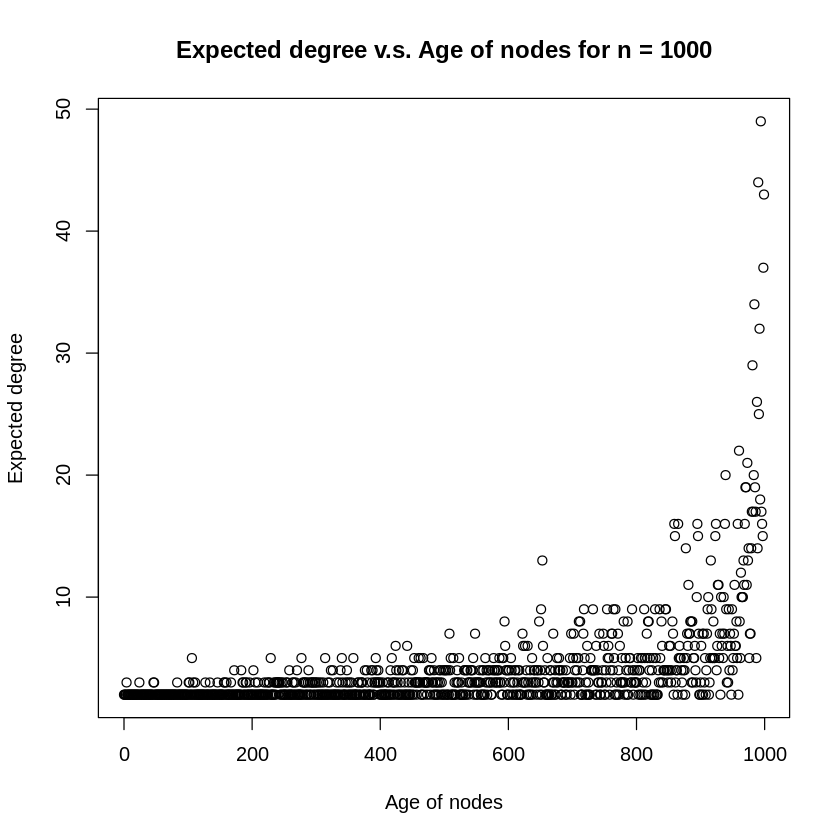

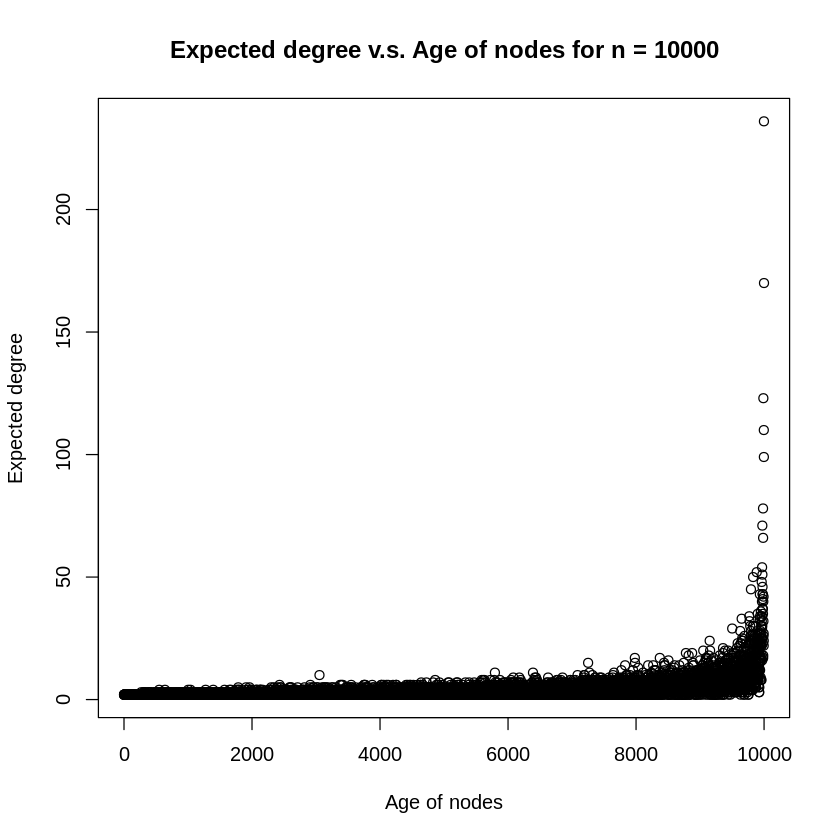

In [41]:
# m = 2 (f)
# n = 1000
n <- 1000
node_age = n - seq(1:n)
plot(node_age, degree(pa)[1:1000], main=paste("Expected degree v.s. Age of nodes for n =", n), xlab="Age of nodes", ylab="Expected degree")

# n = 10000
n <- 10000
node_age = n - seq(1:n)
plot(node_age, degree(pa_large)[1:10000], main=paste("Expected degree v.s. Age of nodes for n =", n), xlab="Age of nodes", ylab="Expected degree")

[1] TRUE


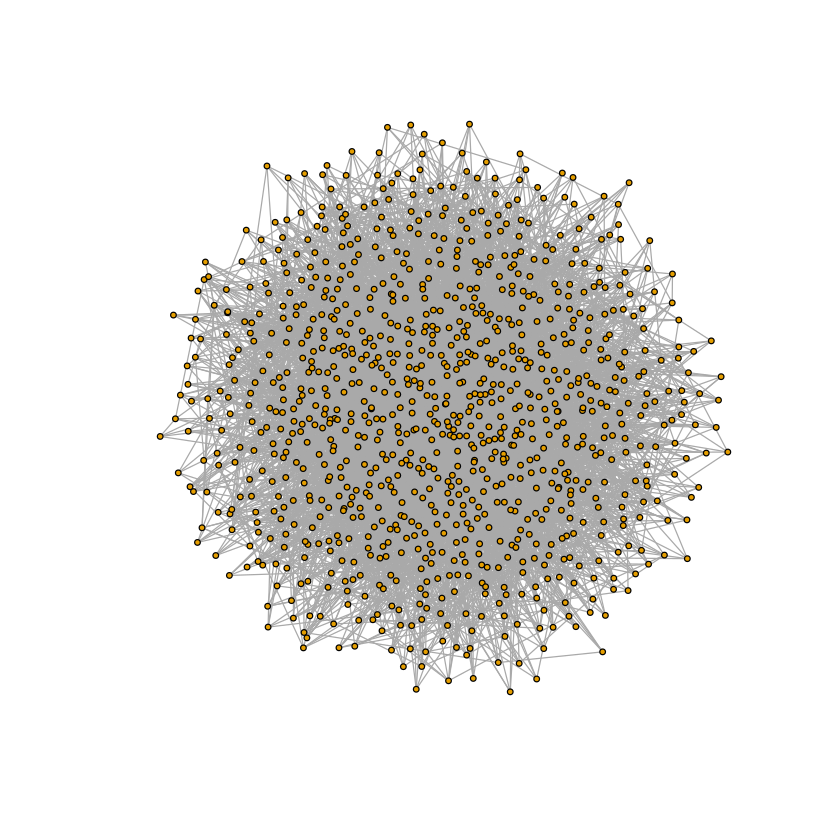

In [11]:
# m = 5 (a)
pa = barabasi.game(1000, m=5, directed=F)
print(is.connected(pa))

plot(pa, vertex.size=2, vertex.label=NA)

[1] "Modularity:  0.272806342799713"


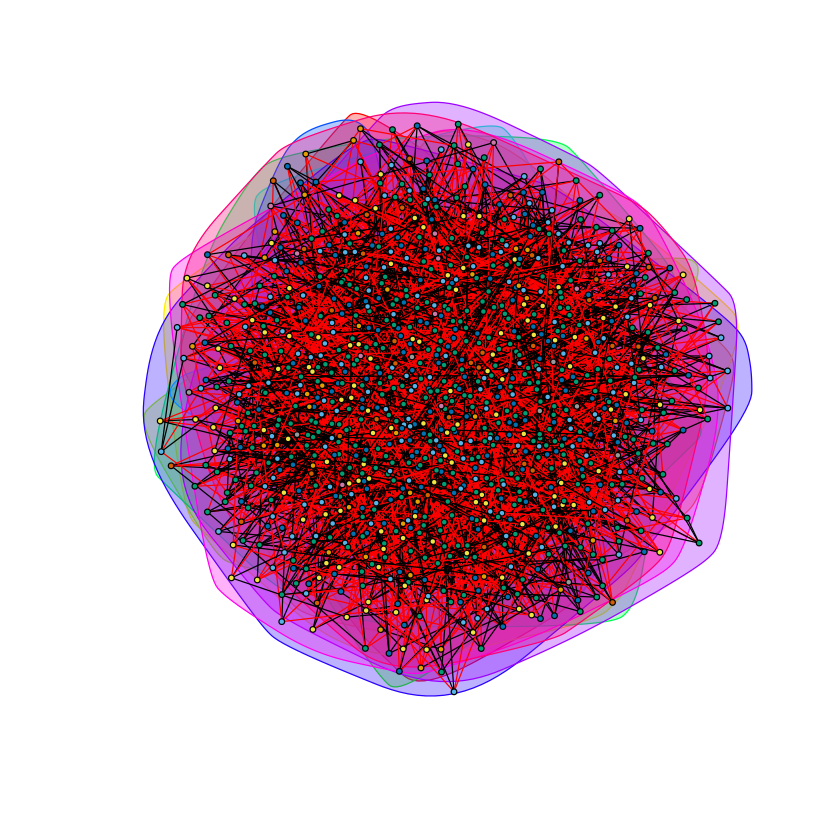

In [12]:
# m = 5 (b)
pa_modularity(pa, n = 1000)
plot(fastgreedy.community(pa), pa, vertex.size=2, vertex.label=NA)

[1] "Modularity:  0.274512188206827"


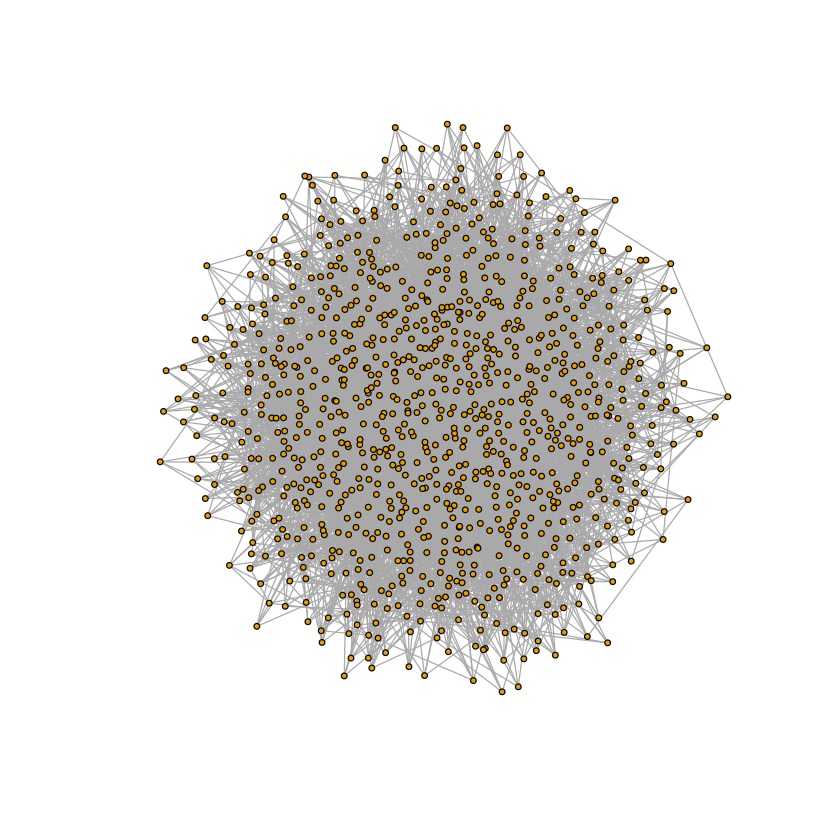

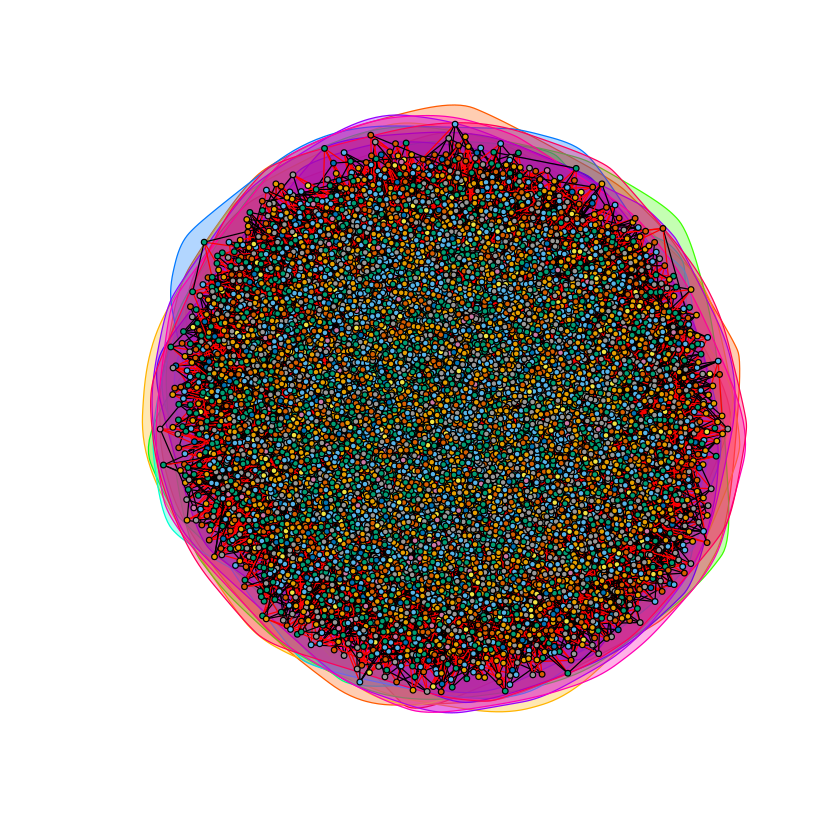

In [13]:
# m = 5 (c)
pa_large = barabasi.game(10000, m=5, directed=F)
pa_modularity(pa_large, n = 10000)
plot(pa, vertex.size=2, vertex.label=NA)
plot(fastgreedy.community(pa_large), pa_large, vertex.size=2, vertex.label=NA)


Call:
lm(formula = log(probability) ~ log(degree))

Coefficients:
(Intercept)  log(degree)  
    -0.1815      -1.8009  



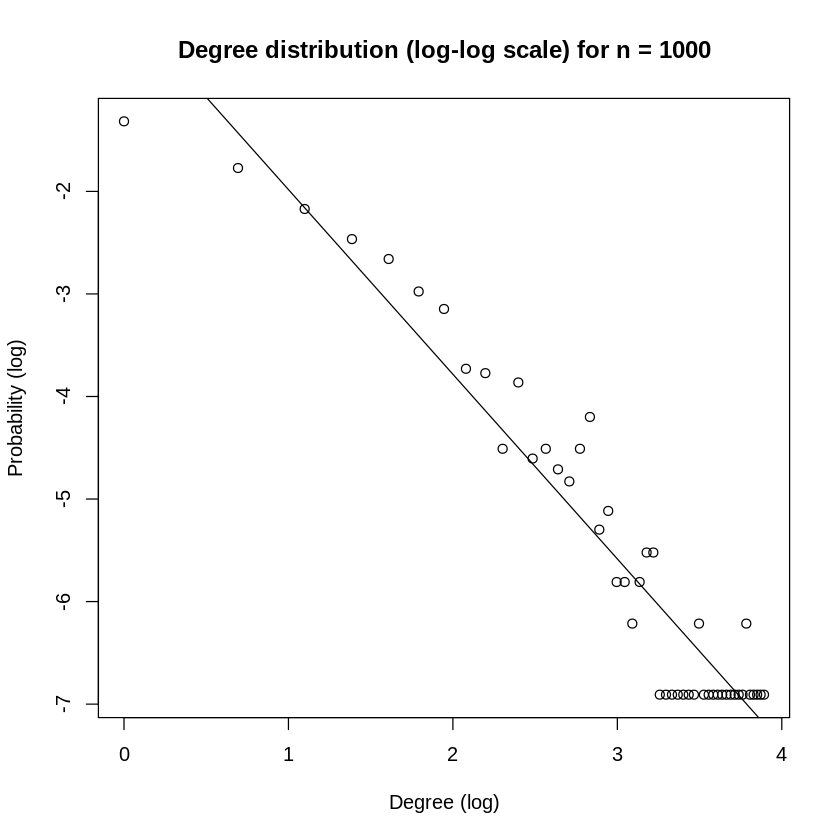


Call:
lm(formula = log(probability) ~ log(degree))

Coefficients:
(Intercept)  log(degree)  
     0.5951      -2.1597  



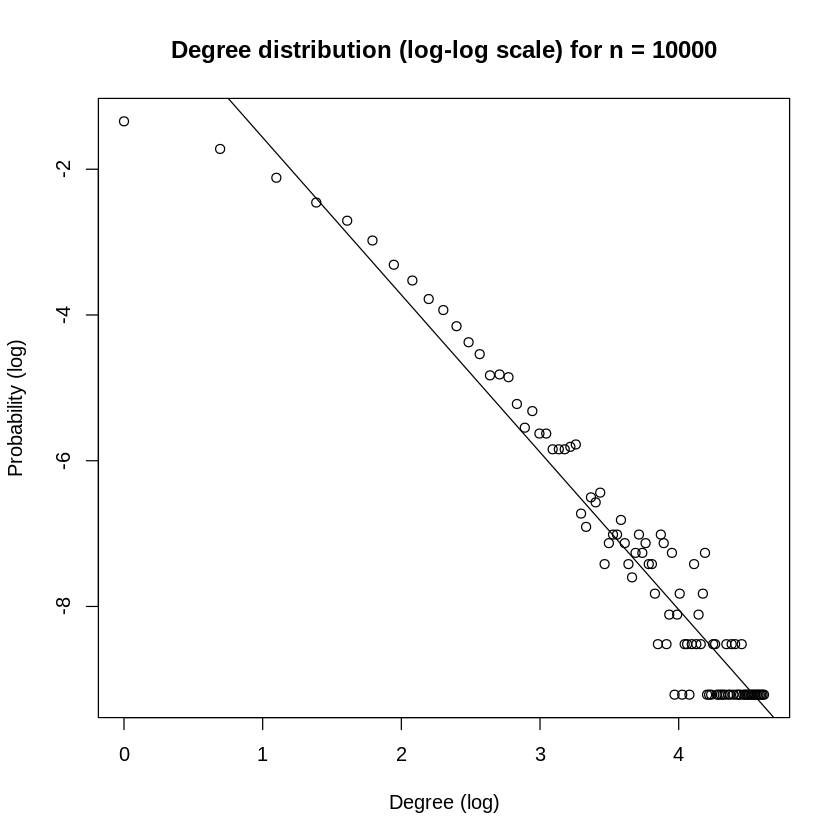

In [45]:
# m = 5 (d)
pa_log(pa, n = 1000)
pa_log(pa_large, n = 10000)

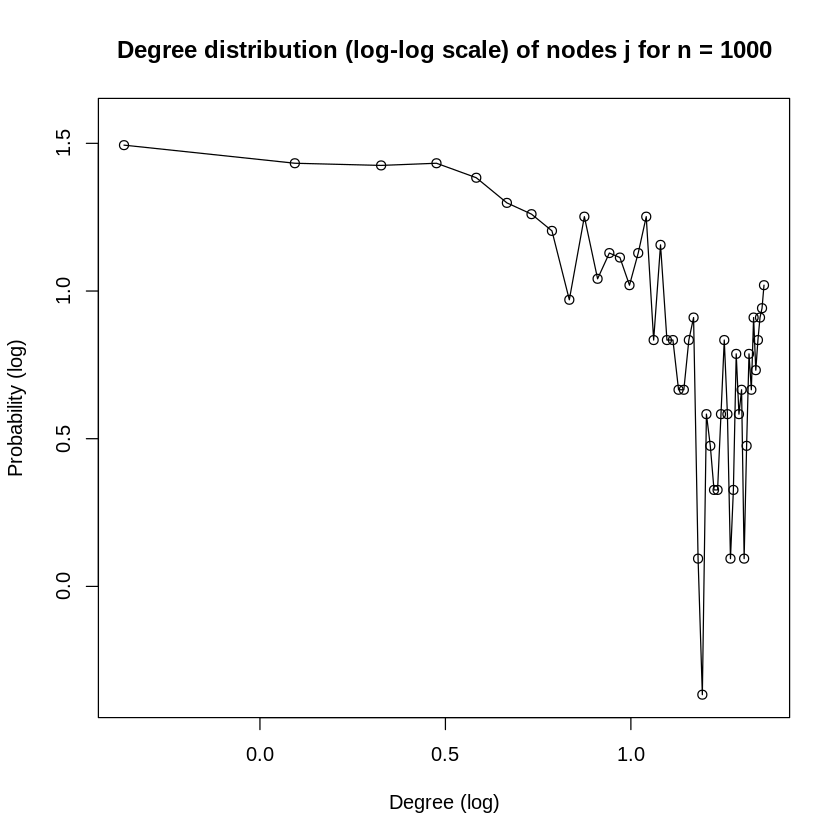

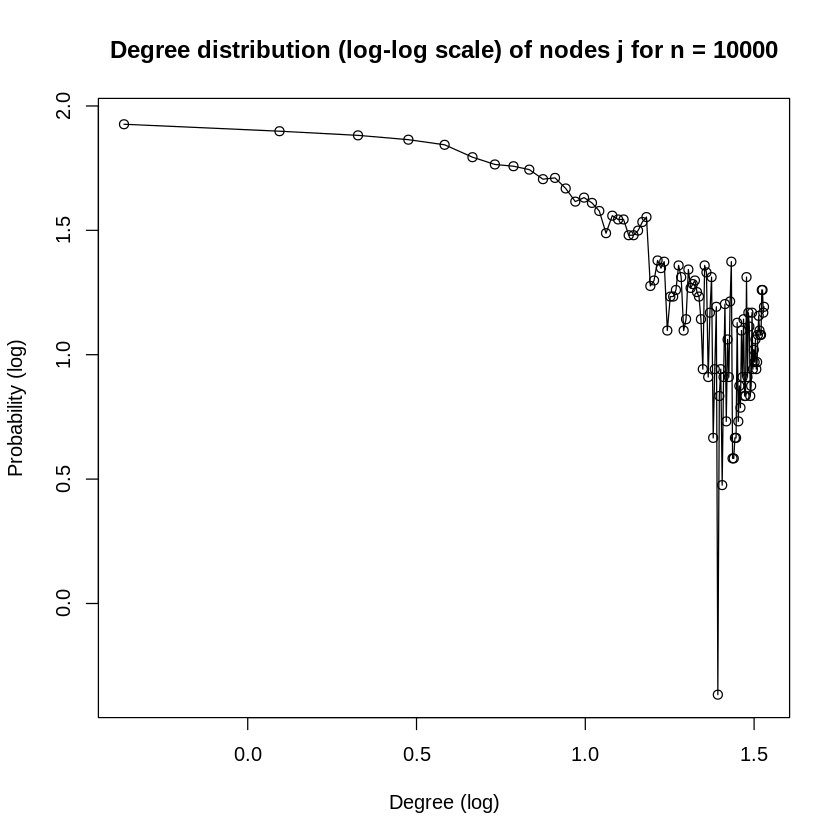

In [46]:
# m = 5 (e)
pa_neighbors(pa,1000)
pa_neighbors(pa_large,10000)

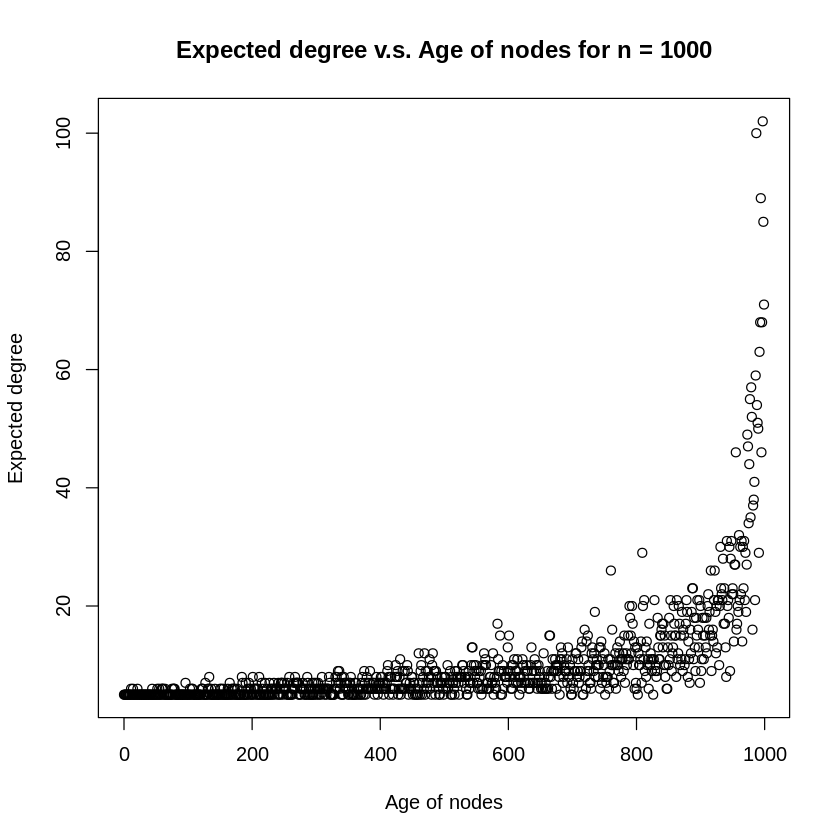

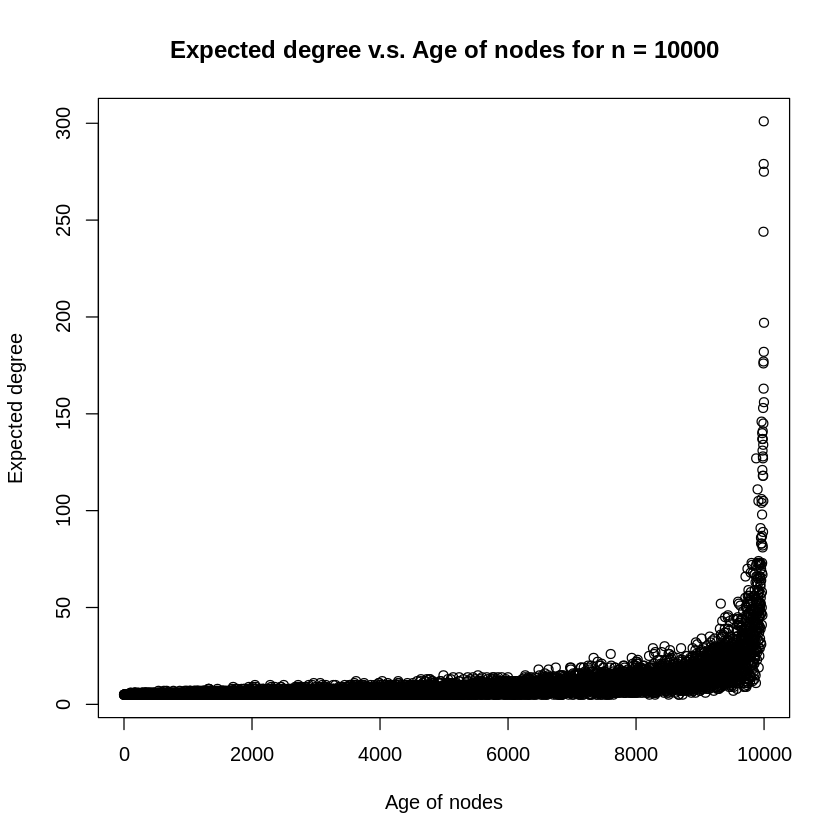

In [47]:
# m = 5 (f)
# n = 1000
n <- 1000
node_age = n - seq(1:n)
plot(node_age, degree(pa)[1:1000], main=paste("Expected degree v.s. Age of nodes for n =", n), xlab="Age of nodes", ylab="Expected degree")

# n = 10000
n <- 10000
node_age = n - seq(1:n)
plot(node_age, degree(pa_large)[1:10000], main=paste("Expected degree v.s. Age of nodes for n =", n), xlab="Age of nodes", ylab="Expected degree")

[1] "Modularity:  0.930977524070617"


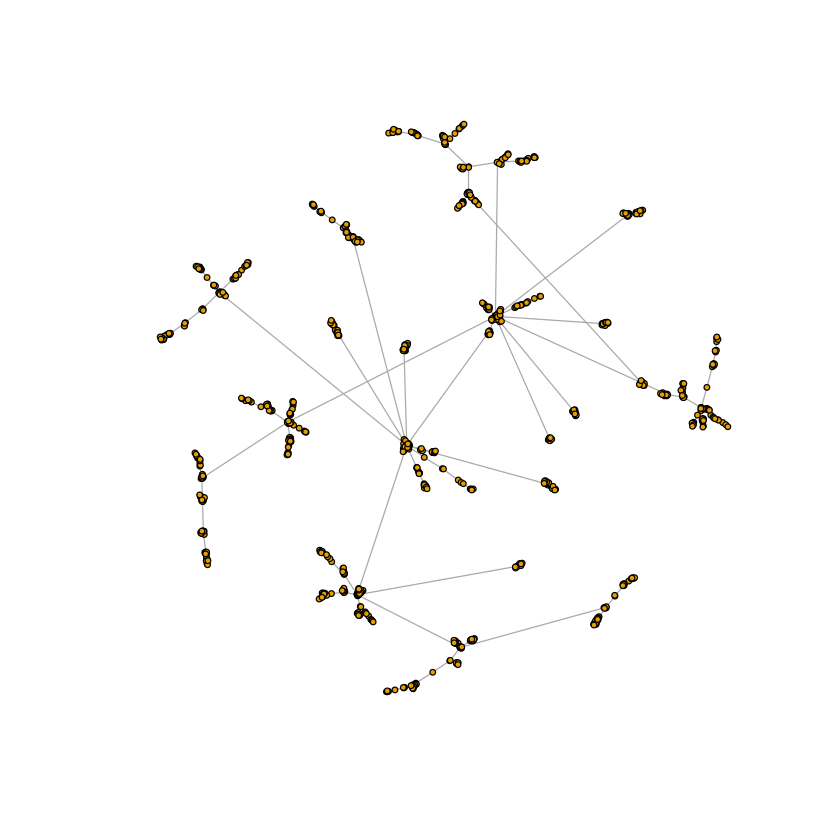

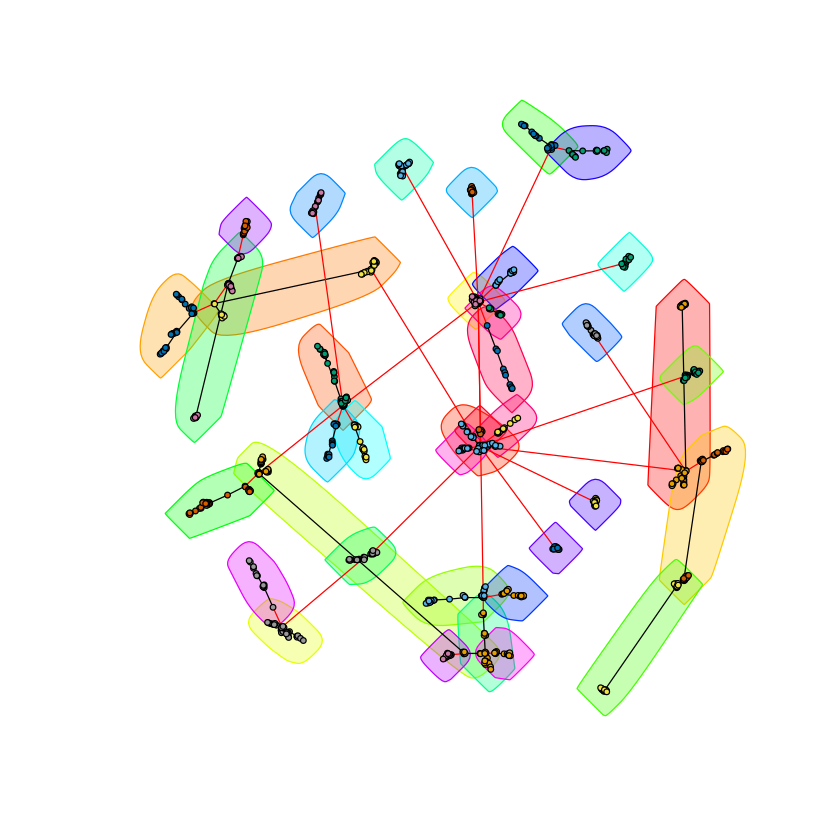

In [49]:
#Q1-2(h)
pa = barabasi.game(1000, m=1, directed=F)

pa_modularity(pa,n = 1000)
plot(pa, vertex.size=2, vertex.label=NA)
plot(fastgreedy.community(pa), pa, vertex.size=2, vertex.label=NA)

[1] "Modularity:  0.847966084202317"


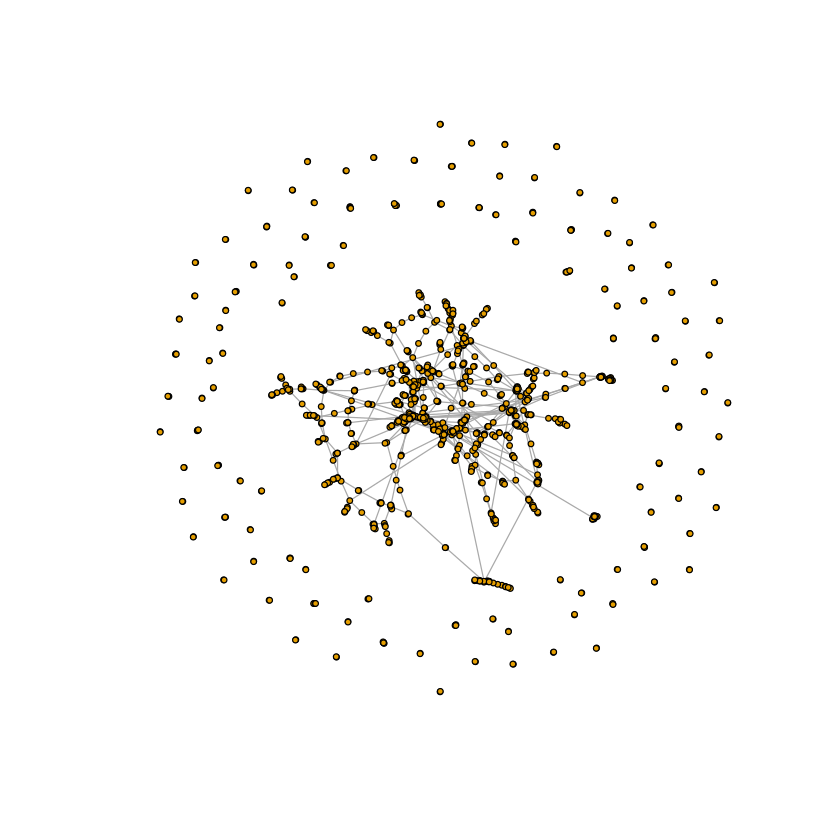

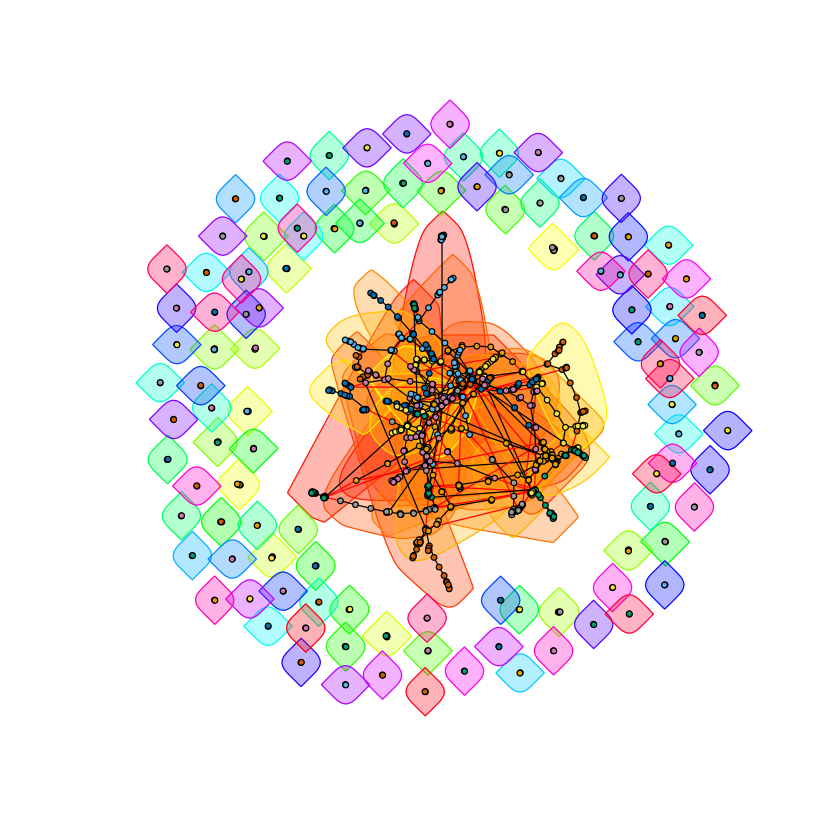

In [50]:
pa_stub = sample_degseq(degree(pa), method="simple.no.multiple")

pa_modularity(pa_stub,n = 1000)
plot(pa_stub, vertex.size=2, vertex.label=NA)
plot(fastgreedy.community(pa_stub), pa_stub, vertex.size=2, vertex.label=NA)

Warning message in xy.coords(x, y, xlabel, ylabel, log):
“6 y values <= 0 omitted from logarithmic plot”


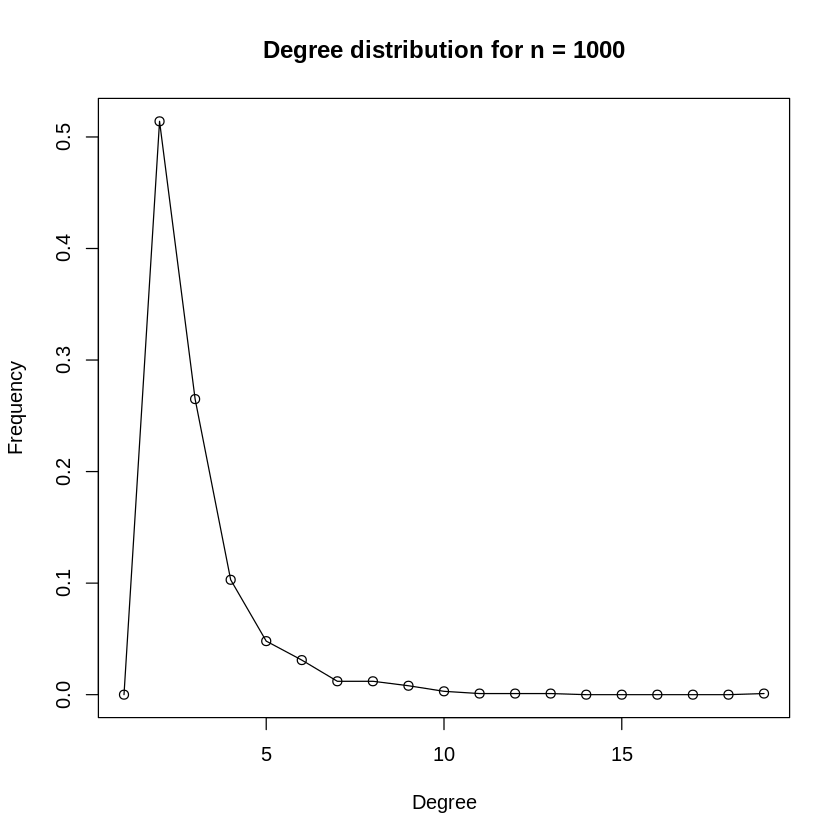

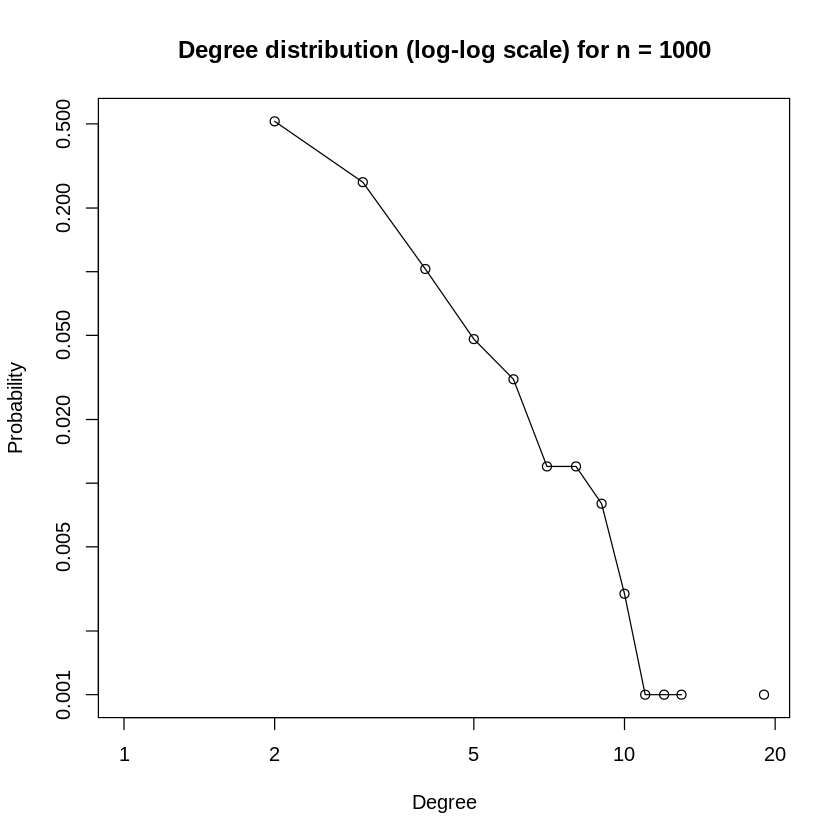

In [52]:
# Q1-3(a)
n = 1000
m = 1
alpha = 1
beta = -1
a = c = d = 1
b = 0

pa_age = sample_pa_age(n=n, pa.exp=alpha, m=m, aging.exp=beta, zero.deg.appeal=a, 
                       zero.age.appeal=b, deg.coef=c, age.coef=d, aging.bin=1000, directed=FALSE)

plot(degree.distribution(pa_age), type = 'o', main=paste("Degree distribution for n =", n), xlab = "Degree", ylab = "Frequency") 

plot(degree.distribution(pa_age), log="xy", type = 'o', main=paste("Degree distribution (log-log scale) for n =", n), xlab="Degree", ylab="Probability")

[1] "Modularity:  0.935350265180095"


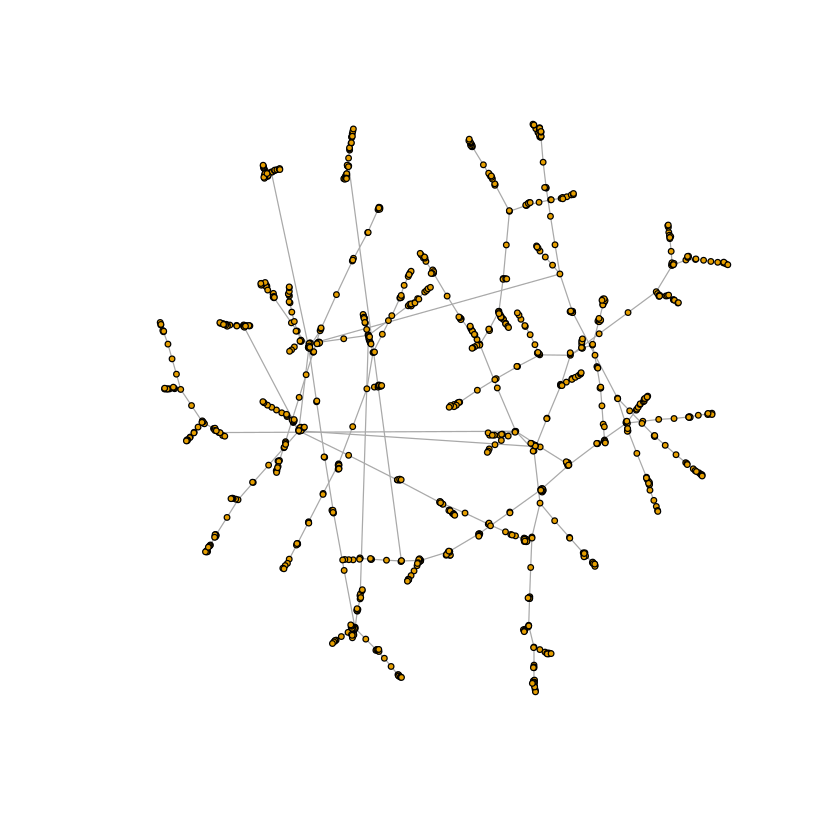

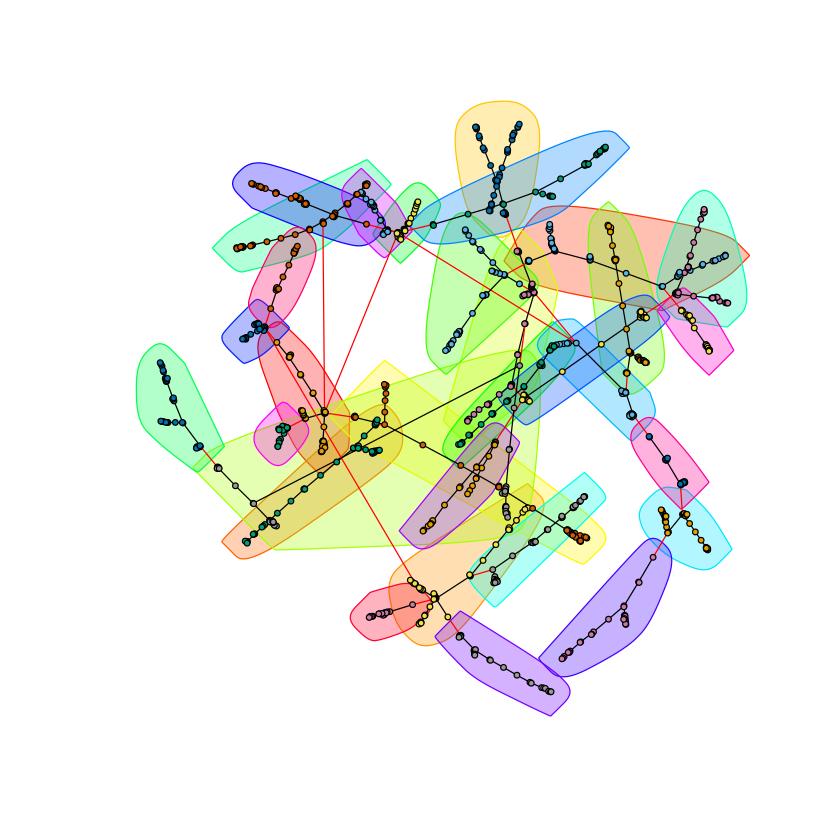

In [53]:
# Q1-3(b)
pa_modularity(pa_age,n = 1000)
plot(pa_age, vertex.size=2, vertex.label=NA)
plot(fastgreedy.community(pa_age), pa_age, vertex.size=2, vertex.label=NA)